# TELECOM CHURN CASE STUDY

## Problem Statement:

In the telecom industry, customers are able to choose from multiple service providers and actively switch from one operator to another. In this highly competitive market, the telecommunications industry experiences an average of 15-25% annual churn rate. Given the fact that it costs 5-10 times more to acquire a new customer than to retain an existing one, customer retention has now become even more important than customer acquisition.

For many incumbent operators, retaining high profitable customers is the number one business goal. To reduce customer churn, telecom companies need to predict which customers are at high risk of churn. In this project, you will analyze customer-level data of a leading telecom firm, build predictive models to identify customers at high risk of churn.

## Business Goal:

In this competition, the primary goal is to build a machine learning model that is able to predict churning customers based on the features provided for thir usage.
ir usage.

#### Steps followed:

**Data Understanding, Preparation, and Pre-Processing:**
- Data understanding involves the identification of potentially useful and non-useful attributes, as well as variable importance and impact estimation.
- Data preparation includes performing data cleaning, missing values imputation, outlier removal, and column level standardization (e.g., date) into one format.

**Exploratory Data Analysis:**
- Basic preliminary data analysis involves finding the correlation between variables and scatter plots to identify relationships between variables.
- Advanced data analysis includes plotting relevant heatmaps, histograms, and basic clustering to find patterns in the data.

**Feature Engineering and Variable Transformation:**
- Feature engineering involves performing one or more methods on attributes that can lead to the creation of a new potentially useful variable (e.g., day from the date).
- Variable transformation includes applying categorical variable transformations to turn them into numerical data and numerical variable transformations to scale the data.

**Model Selection, Model Building, and Prediction:**
- Identifying the type of problem and making a list of decisive models from all available choices.
- Choosing a training mechanism (e.g., cross-validation) and tuning hyperparameters of each model.
- Testing each model on the respective model evaluation metric.
- Choosing the best model based on the fit of the data set and output variable.
- Using ensemble options to improve efficacy based on the evaluation metric stated in the problem.

**Business Recommendation**


#### Importing modules and libraries

In [302]:
import pandas as pd 
import numpy as np
import warnings

import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import math
from IPython.display import Markdown, display ,HTML

from sklearn.model_selection import train_test_split

sns.set(style="whitegrid")
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_colwidth', None)  # make sure data and columns are displayed correctly withput purge
pd.options.display.float_format = '{:20,.2f}'.format # display float value with correct precision 

warnings.filterwarnings('ignore')

In [599]:
# Importing classification report and confusion matrix from sklearn metrics
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score,roc_auc_score,roc_curve, recall_score

# Import the StandardScaler()
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import RFE
from sklearn.decomposition import IncrementalPCA
from sklearn.model_selection import StratifiedShuffleSplit

#Improting the PCA module
from sklearn.decomposition import PCA

# Importing required packages for visualization
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydot, graphviz

# Other sklearn packages
import sklearn.metrics as metrics
from sklearn.tree import DecisionTreeClassifier

from datetime import date,datetime
import math
import multiprocessing

# importing libraries for Model building 
from sklearn.linear_model import LogisticRegression
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
import xgboost as xgb
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.inspection import permutation_importance
from sklearn.tree import DecisionTreeClassifier

from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
#from sklearn.metrics import plot_roc_curve
from sklearn.metrics import precision_score, recall_score
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import f1_score

In [304]:
telecom_df=pd.read_csv('train.csv')
telecom_df.head()

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability
0,0,109,0.00,0.00,0.00,6/30/2014,7/31/2014,8/31/2014,31.28,87.01,7.53,48.58,124.38,1.29,32.24,96.68,2.33,0.00,0.00,0.00,0.00,0.00,0.00,2.23,0.00,0.28,5.29,16.04,2.33,0.00,0.00,0.00,0.00,0.00,0.00,7.53,16.04,2.61,46.34,124.38,1.01,18.75,80.61,0.00,0.00,0.00,0.00,0.00,0.00,0.00,65.09,204.99,1.01,0.00,0.00,0.00,8.20,0.63,0.00,0.38,0.00,0.00,81.21,221.68,3.63,2.43,3.68,7.79,0.83,21.08,16.91,0.00,0.00,0.00,3.26,24.76,24.71,0.00,7.61,0.21,7.46,19.96,14.96,0.00,0.00,0.00,0.00,0.00,0.00,7.46,27.58,15.18,11.84,53.04,40.56,0.00,0.00,0.66,0.00,0.00,0.00,1.11,0.69,0.00,3,2,2,77,65,10,65,65,10,6/22/2014,7/10/2014,8/24/2014,65,65,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00,0.00,0.00,0.00,0.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,1958,0.00,0.00,0.00,0
1,1,109,0.00,0.00,0.00,6/30/2014,7/31/2014,8/31/2014,0.00,122.79,42.95,0.00,0.00,0.00,0.00,25.99,30.89,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,22.01,29.79,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,30.73,31.66,0.00,0.00,0.00,0.00,30.73,31.66,1.68,19.09,10.53,1.41,18.68,11.09,0.35,1.66,3.40,3.44,39.44,25.03,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,3.44,39.44,25.04,0.00,0.00,0.01,0.00,0.00,0.00,0.00,0.00,0.00,3,4,5,0,145,50,0,145,50,6/12/2014,7/10/2014,8/26/2014,0,0,0,NaN,7/8/2014,

In [305]:
telecom_df.shape

(69999, 172)

In [306]:
telecom_df.info(verbose=1)
telecom_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69999 entries, 0 to 69998
Data columns (total 172 columns):
 #    Column                    Dtype  
---   ------                    -----  
 0    id                        int64  
 1    circle_id                 int64  
 2    loc_og_t2o_mou            float64
 3    std_og_t2o_mou            float64
 4    loc_ic_t2o_mou            float64
 5    last_date_of_month_6      object 
 6    last_date_of_month_7      object 
 7    last_date_of_month_8      object 
 8    arpu_6                    float64
 9    arpu_7                    float64
 10   arpu_8                    float64
 11   onnet_mou_6               float64
 12   onnet_mou_7               float64
 13   onnet_mou_8               float64
 14   offnet_mou_6              float64
 15   offnet_mou_7              float64
 16   offnet_mou_8              float64
 17   roam_ic_mou_6             float64
 18   roam_ic_mou_7             float64
 19   roam_ic_mou_8             float64
 20   roam

In [307]:
telecom_df.describe()

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability
count,"69,999.00","69,999.00","69,297.00","69,297.00","69,297.00","69,999.00","69,999.00","69,999.00","67,231.00","67,312.00","66,296.00","67,231.00","67,312.00","66,296.00","67,231.00","67,312.00","66,296.00","67,231.00","67,312.00","66,296.00","67,231.00","67,312.00","66,296.00","67,231.00","67,312.00","66,296.00","67,231.00","67,312.00","66,296.00","67,231.00","67,312.00","66,296.00","67,231.00","67,312.00","66,296.00","67,231.00","67,312.00","66,296.00","67,231.00","67,312.00","66,296.00","67,231.00","67,312.00","66,296.00","67,231.00","67,312.00","66,296.00","67,231.00","67,312.00","66,296.00","67,231.00","67,312.00","66,296.00","67,231.00","67,312.00","66,296.00","67,231.00","67,312.00","66,296.00","69,999.00","69,999.00","69,999.00","67,231.00","67,312.00","66,296.00","67,231.00","67,312.00","66,296.00","67,231.00","67,312.00","66,296.00","67,231.00","67,312.00","66,296.00","67,231.00","67,312.00","66,296.00","67,231.00","67,312.00","66,296.00","67,231.00","67,312.00","66,296.00","67,231.00","67,312.00","66,296.00","67,231.00","67,312.00","66,296.00","69,999.00","69,999.00","69,999.00","67,231.00","67,312.00","66,296.00","67,231.00","67,312.00","66,296.00","67,231.00","67,312.00","66,296.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","17,568.00","17,865.00","18,417.00","17,568.00","17,865.00","18,417.00","17,568.00","17,865.00","18,417.00","17,568.00","17,865.00","18,417.00","17,568.00","17,865.00","18,417.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","17,568.00","17,865.00","18,417

## STEP 1: Data Understanding, Preparation, and Pre-Processing


In [308]:
# Function to check missing values percentages
def check_missing_vale_percentage(soruce_df):
    pd.set_option('display.max_rows', None)
    telecom_null_check = 100*soruce_df.isnull().sum()/len(soruce_df)
    df = pd.DataFrame(telecom_null_check)
    df.rename(columns={0:'Null_Percentage'}, inplace=True)
    return df.sort_values('Null_Percentage', ascending=False)

In [309]:
missing_val_df = check_missing_vale_percentage(telecom_df)
missing_val_df

,Null_Percentage
arpu_3g_6,74.90
count_rech_2g_6,74.90
night_pck_user_6,74.90
arpu_2g_6,74.90
date_of_last_rech_data_6,74.90
total_rech_data_6,74.90
av_rech_amt_data_6,74.90
max_rech_data_6,74.90
count_rech_3g_6,74.90
fb_user_6,74.90


##### We can see columns with as high as 74.90 % of missing values. So we consider removing column more than 70%.

In [310]:
# Null columns list
Miss_Val_Cols_70=list(missing_val_df.index[missing_val_df['Null_Percentage'] > 70])
(Miss_Val_Cols_70)

['arpu_3g_6',
 'count_rech_2g_6',
 'night_pck_user_6',
 'arpu_2g_6',
 'date_of_last_rech_data_6',
 'total_rech_data_6',
 'av_rech_amt_data_6',
 'max_rech_data_6',
 'count_rech_3g_6',
 'fb_user_6',
 'night_pck_user_7',
 'date_of_last_rech_data_7',
 'total_rech_data_7',
 'max_rech_data_7',
 'fb_user_7',
 'count_rech_2g_7',
 'count_rech_3g_7',
 'arpu_3g_7',
 'av_rech_amt_data_7',
 'arpu_2g_7',
 'count_rech_2g_8',
 'av_rech_amt_data_8',
 'night_pck_user_8',
 'max_rech_data_8',
 'total_rech_data_8',
 'arpu_2g_8',
 'arpu_3g_8',
 'date_of_last_rech_data_8',
 'fb_user_8',
 'count_rech_3g_8']

##### We will still keep the max, total and average recharge data , as we assume that these columns will give valuable insights while building the model based on general human behaviour.

In [311]:
# Removing the columns as per above condition
RECHARGE_COLS=['max_rech_data_6','max_rech_data_7','max_rech_data_8','total_rech_data_6','total_rech_data_7','total_rech_data_8','av_rech_amt_data_6','av_rech_amt_data_7','av_rech_amt_data_8']
Miss_Val_Cols_70=telecom_df.columns[round(100*telecom_df.isnull().sum()/len(telecom_df),2)> 70]
Miss_Val_Cols_70=[col for col in Miss_Val_Cols_70 if col not in RECHARGE_COLS]
telecom_df=telecom_df.drop(Miss_Val_Cols_70,axis=1)
telecom_df.shape

(69999, 151)

In [312]:
# Checking missing values percentages
check_missing_vale_percentage(telecom_df)

,Null_Percentage
av_rech_amt_data_6,74.90
max_rech_data_6,74.90
total_rech_data_6,74.90
av_rech_amt_data_7,74.48
max_rech_data_7,74.48
total_rech_data_7,74.48
max_rech_data_8,73.69
total_rech_data_8,73.69
av_rech_amt_data_8,73.69
std_og_t2c_mou_8,5.29


##### The missing value percentage of recharge columns are in consistent range , also the minimum value of recharge is 1, hecne we will impute the missing values(NA) with zero stating that customer has not done any recharge

In [313]:
# impute missing values with 0
telecom_df[RECHARGE_COLS] = telecom_df[RECHARGE_COLS].apply(lambda x: x.fillna(0))

In [314]:
print(telecom_df[RECHARGE_COLS].isnull().sum()*100/telecom_df.shape[1])

max_rech_data_6                      0.00
max_rech_data_7                      0.00
max_rech_data_8                      0.00
total_rech_data_6                    0.00
total_rech_data_7                    0.00
total_rech_data_8                    0.00
av_rech_amt_data_6                   0.00
av_rech_amt_data_7                   0.00
av_rech_amt_data_8                   0.00
dtype: float64


In [315]:
# Dropping the ID and Date columns as not required. 
ID_COLS = ['mobile_number', 'circle_id', 'id']
DATE_COLS = ['last_date_of_month_6','last_date_of_month_7','last_date_of_month_8','date_of_last_rech_6','date_of_last_rech_7','date_of_last_rech_8','date_of_last_rech_data_6','date_of_last_rech_data_7','date_of_last_rech_data_8']

total_cols_to_drop =ID_COLS + DATE_COLS
exiting_cols = telecom_df.shape[1]
cols_to_drop=[col for col in total_cols_to_drop if col in telecom_df.columns]
telecom_df=telecom_df.drop(cols_to_drop,axis=1)
telecom_df.shape

(69999, 143)

##### Exploring the remaining null value columns like loc_og_mou_7, loc_ic_t2m_mou_7 etc, which are basically different types of calling charges related columns, we can impute them with Zero assuming that no calls haven been made for that call type.

In [316]:
# imputing the remaining null columns as 0. 
#EXCLUDE_COLS =  ['night_pck_user_6','night_pck_user_7','night_pck_user_8','night_pck_user_9','fb_user_6','fb_user_7','fb_user_8','fb_user_9']


telecom_df[telecom_df.select_dtypes(exclude=['datetime64[ns]','category']).columns.tolist()] = telecom_df[telecom_df.select_dtypes(exclude=['datetime64[ns]','category']).columns.tolist()].fillna(0, axis=1)

In [317]:
check_missing_vale_percentage(telecom_df)

,Null_Percentage
loc_og_t2o_mou,0.00
ic_others_8,0.00
spl_ic_mou_8,0.00
isd_ic_mou_6,0.00
isd_ic_mou_7,0.00
isd_ic_mou_8,0.00
ic_others_6,0.00
ic_others_7,0.00
total_rech_num_6,0.00
spl_ic_mou_6,0.00


In [318]:
 telecom_df.describe()

,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability
count,"69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00"
mean,0.00,0.00,0.00,283.13,278.19,278.86,127.89,128.75,125.94,191.01,189.59,186.15,9.38,6.75,6.63,13.63,9.46,9.25,45.05,44.39,43.27,89.55,87.31,86.30,3.60,3.63,3.47,1.08,1.3

##### We can see there are columns(loc_og_t2o_mou,std_og_t2o_mou, loc_ic_t2o_mou) with Zero standard deviation so these columns typically do not contribute any useful information for analysis or modeling purposes because they dont have variability.

In [319]:
# Checking value count
print(telecom_df.loc_og_t2o_mou.value_counts(dropna= False))
print(telecom_df.std_og_t2o_mou.value_counts(dropna= False))
print(telecom_df.loc_ic_t2o_mou.value_counts(dropna= False))

loc_og_t2o_mou
0.00    69999
Name: count, dtype: int64
std_og_t2o_mou
0.00    69999
Name: count, dtype: int64
loc_ic_t2o_mou
0.00    69999
Name: count, dtype: int64


##### The columns are having either zero or missing values

In [320]:
# Dropping above 3 columns
telecom_df.drop(['loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou'], axis= 1, inplace= True)


In [321]:
telecom_df.shape

(69999, 140)

In [322]:
## Function to count the number unique values present in the columns.
def unique_nan(df):
    return df.nunique(dropna=False).sort_values(ascending=False)

In [323]:
unique_nan(telecom_df)

arpu_6                61615
arpu_7                61425
arpu_8                60194
total_og_mou_7        33195
total_og_mou_6        33135
total_og_mou_8        32897
total_ic_mou_6        27432
total_ic_mou_7        27418
total_ic_mou_8        27318
offnet_mou_6          26254
offnet_mou_7          26139
offnet_mou_8          25995
loc_ic_mou_6          24442
loc_ic_mou_7          24258
loc_ic_mou_8          24182
loc_og_mou_6          22309
std_og_mou_7          22088
loc_og_mou_7          22012
loc_og_mou_8          21950
std_og_mou_6          21837
std_og_mou_8          21745
onnet_mou_7           20076
onnet_mou_6           20057
onnet_mou_8           19725
loc_ic_t2m_mou_6      19034
loc_ic_t2m_mou_8      19022
loc_ic_t2m_mou_7      18945
loc_og_t2m_mou_6      17848
loc_og_t2m_mou_7      17641
loc_og_t2m_mou_8      17616
std_og_t2m_mou_7      16234
std_og_t2m_mou_6      16059
std_og_t2m_mou_8      15968
std_og_t2t_mou_7      14745
std_og_t2t_mou_6      14554
std_og_t2t_mou_8    

In [324]:
# Dropping columns with only 1 unique value
cols = []
for i in telecom_df.columns:
    if telecom_df[i].nunique() ==1:
        cols.append(i)
        
cols

telecom_df.drop(cols, axis= 1, inplace= True)
telecom_df.shape

(69999, 134)

In [325]:
check_missing_vale_percentage(telecom_df)

,Null_Percentage
arpu_6,0.00
isd_ic_mou_6,0.00
max_rech_amt_8,0.00
max_rech_amt_7,0.00
max_rech_amt_6,0.00
total_rech_amt_8,0.00
total_rech_amt_7,0.00
total_rech_amt_6,0.00
total_rech_num_8,0.00
total_rech_num_7,0.00


##### Data cleaning is done and at last there are no more missing values present in the data


## Step 2 :  EDA

In [326]:
# check class imbalance
telecom_df['churn_probability'].value_counts()

churn_probability
0.00    62867
1.00     7132
Name: count, dtype: int64

churn_probability
0.00                  89.81
1.00                  10.19
Name: count, dtype: float64


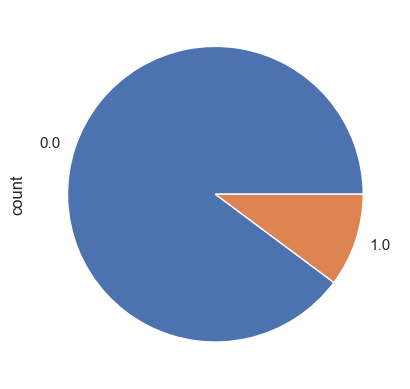

In [327]:
# plot for class imbalance
print((telecom_df['churn_probability'].value_counts()/len(telecom_df))*100)
((telecom_df['churn_probability'].value_counts()/len(telecom_df))*100).plot(kind="pie")
plt.show()

In [328]:
# checking for null values
telecom_df.isna().sum().sum()

0

In [329]:
telecom_df.info(verbose=1)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69999 entries, 0 to 69998
Data columns (total 134 columns):
 #    Column              Dtype  
---   ------              -----  
 0    arpu_6              float64
 1    arpu_7              float64
 2    arpu_8              float64
 3    onnet_mou_6         float64
 4    onnet_mou_7         float64
 5    onnet_mou_8         float64
 6    offnet_mou_6        float64
 7    offnet_mou_7        float64
 8    offnet_mou_8        float64
 9    roam_ic_mou_6       float64
 10   roam_ic_mou_7       float64
 11   roam_ic_mou_8       float64
 12   roam_og_mou_6       float64
 13   roam_og_mou_7       float64
 14   roam_og_mou_8       float64
 15   loc_og_t2t_mou_6    float64
 16   loc_og_t2t_mou_7    float64
 17   loc_og_t2t_mou_8    float64
 18   loc_og_t2m_mou_6    float64
 19   loc_og_t2m_mou_7    float64
 20   loc_og_t2m_mou_8    float64
 21   loc_og_t2f_mou_6    float64
 22   loc_og_t2f_mou_7    float64
 23   loc_og_t2f_mou_8    float64
 24   

In [330]:
# only churn customers
telecom_churn_data=telecom_df[telecom_df['churn_probability'] == 1]

In [331]:
telecom_churn_data.describe()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability
count,"7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00","7,132.00"
mean,308.29,219.08,114.23,166.78,115.94,49.73,208.53,146.24,62.28,16.01,15.52,14.48,24.59,21.07,20.17,27.38,17.48,7.17,53.54,36.11,14.33,1.66,1.29,0.66,1.07,1.33,0.58,82.58,54.89,22.15,129.06,89.40,33.81,134.04,92.98,34.44,0.57,0.49,0.18,263.69,182.86,68.43,1.41,0.87,0.52,4.13,4.24,1.52,0.56,0.01,0.00,352.37,242.88,92.62,30.37,21.80,7.65,62.14,41.27,16.61,5.19,3.66,1.33,97.71,66.74,25.59,10.73,8.06,2.94,21.07,13.85,5.68,1.08,0.70,0.24,32.87,22.62,8.85,138.60,95.97,37.92,0.05,0.02,0.00,7.35,6.05,3.25,0.61,0.54,0.21,8.11,6.39,3.66,350.78,244.30,120.82,99.17,

In [332]:
telecom_churn_data.info(verbose=1)

<class 'pandas.core.frame.DataFrame'>
Index: 7132 entries, 8 to 69983
Data columns (total 134 columns):
 #    Column              Dtype  
---   ------              -----  
 0    arpu_6              float64
 1    arpu_7              float64
 2    arpu_8              float64
 3    onnet_mou_6         float64
 4    onnet_mou_7         float64
 5    onnet_mou_8         float64
 6    offnet_mou_6        float64
 7    offnet_mou_7        float64
 8    offnet_mou_8        float64
 9    roam_ic_mou_6       float64
 10   roam_ic_mou_7       float64
 11   roam_ic_mou_8       float64
 12   roam_og_mou_6       float64
 13   roam_og_mou_7       float64
 14   roam_og_mou_8       float64
 15   loc_og_t2t_mou_6    float64
 16   loc_og_t2t_mou_7    float64
 17   loc_og_t2t_mou_8    float64
 18   loc_og_t2m_mou_6    float64
 19   loc_og_t2m_mou_7    float64
 20   loc_og_t2m_mou_8    float64
 21   loc_og_t2f_mou_6    float64
 22   loc_og_t2f_mou_7    float64
 23   loc_og_t2f_mou_8    float64
 24   loc_og

In [333]:
# Generate new dataframe for EDA
eda_telecom_df = telecom_df.copy()

In [334]:
# Calculate tenure range
temp_data = eda_telecom_df
# number of days customer using the operator T network
temp_data['tenure'] = temp_data['aon']/30
temp_data['tenure'].head()
tenure_range = [0, 6, 12, 24, 60, 61]
tenure_label = [ '0-6 Months', '6-12 Months', '1-2 Yrs', '2-5 Yrs', '5 Yrs and above']
temp_data['tenure_range'] = pd.cut(temp_data['tenure'], tenure_range, labels=tenure_label)
temp_data['tenure_range'].head()

0        NaN
1    1-2 Yrs
2    2-5 Yrs
3    2-5 Yrs
4    1-2 Yrs
Name: tenure_range, dtype: category
Categories (5, object): ['0-6 Months' < '6-12 Months' < '1-2 Yrs' < '2-5 Yrs' < '5 Yrs and above']

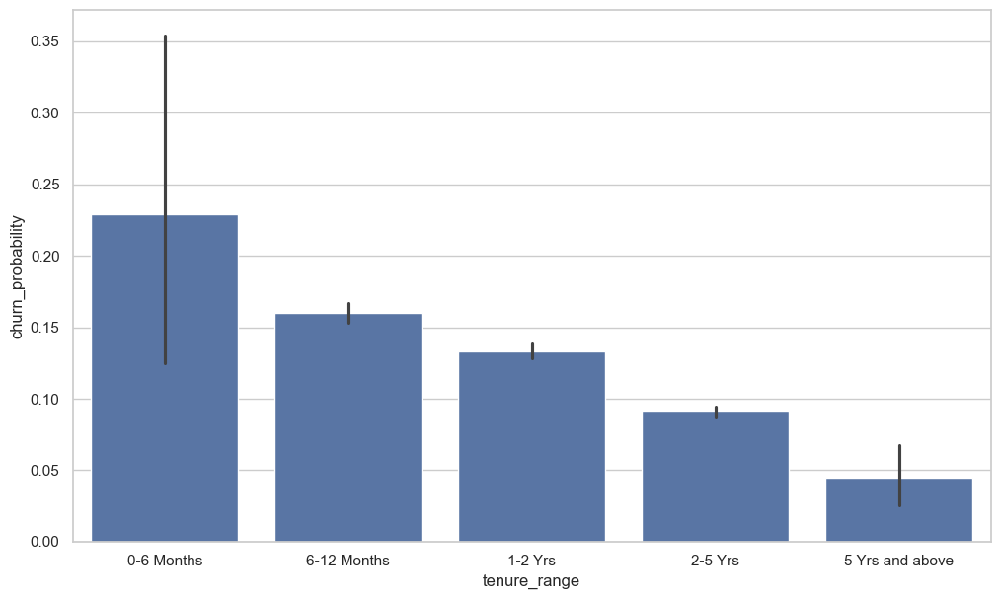

In [335]:
# Plotting a bar plot for tenure range
plt.figure(figsize=[12,7])
sns.barplot(x='tenure_range',y='churn_probability', data=eda_telecom_df)
plt.show()

#### Observation:
        It is observed that for 0 -6 month range, churn probability is higher as compared to other tenure range

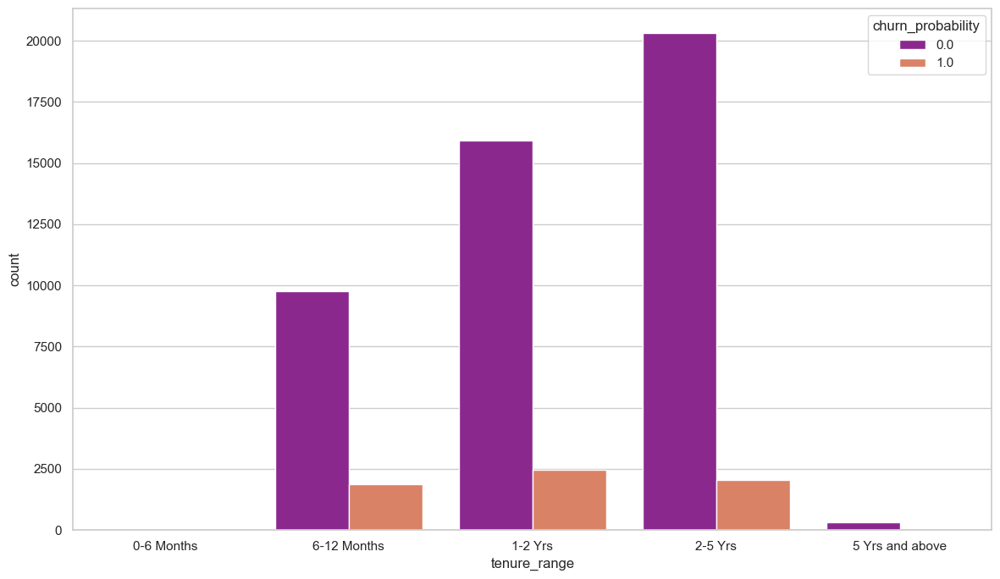

In [336]:
# Plotting a bar plot for tenure range
plt.figure(figsize=(14,8))
sns.countplot(x = 'tenure_range', hue = 'churn_probability',data = temp_data,palette=("plasma"))
plt.show()

#### Observation:
        Churn probability decreases with increase in tenure range

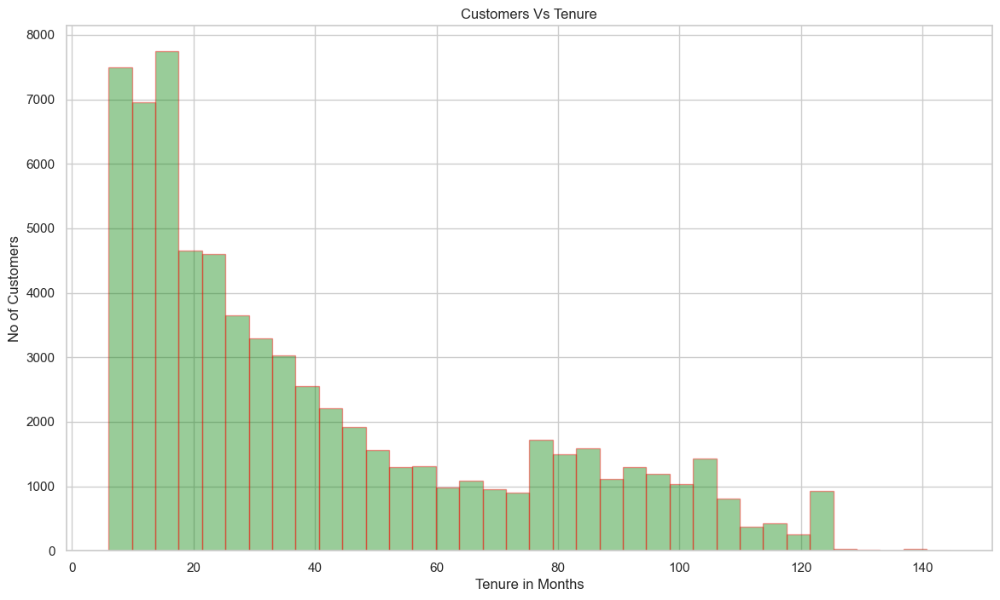

In [337]:
plt.figure(figsize=(14,8))
data = eda_telecom_df
ax = sns.distplot(data['tenure'], hist=True, kde=False, 
             bins=int(180/5), color = 'green', 
             hist_kws={'edgecolor':'red'},
             kde_kws={'linewidth': 4})
ax.set_ylabel('No of Customers')
ax.set_xlabel('Tenure in Months')
ax.set_title('Customers Vs Tenure')
plt.show()

#### Observation:
        Custmer preference is lower tenure as we see higher tenure customers are lesser.

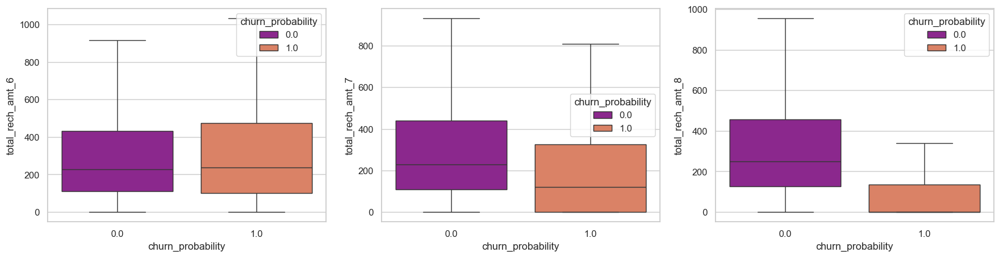

In [338]:
# plot for total_rech_amt for month 6, 7 and 8 months

plt.figure(figsize=(20,10))
temp_data = eda_telecom_df
plt.subplot(2,3,1)
sns.boxplot(data=temp_data, y="total_rech_amt_6",x="churn_probability",hue="churn_probability",
showfliers=False,palette=("plasma"))
plt.subplot(2,3,2)
sns.boxplot(data=temp_data, y="total_rech_amt_7",x="churn_probability",hue="churn_probability",
                showfliers=False,palette=("plasma"))
plt.subplot(2,3,3)
sns.boxplot(data=temp_data, y="total_rech_amt_8",x="churn_probability",hue="churn_probability",
                showfliers=False,palette=("plasma"))
plt.show()

#### Observation:
        Major drop in the total recharge amount for churned customers in the 8th Month

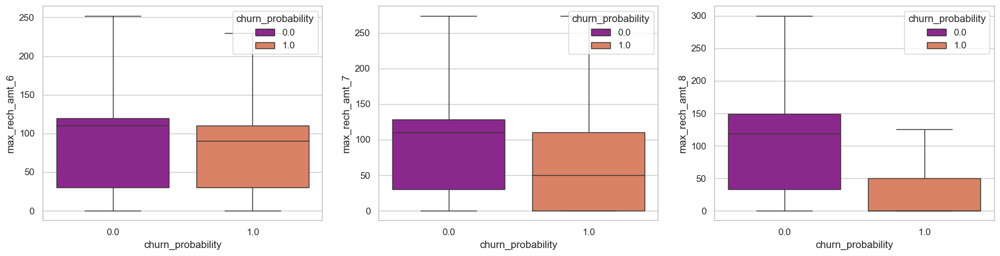

In [339]:
# plot for max_rech_amt for month 6, 7 and 8 months

plt.figure(figsize=(20,10))
temp_data = eda_telecom_df
plt.subplot(2,3,1)
sns.boxplot(data=temp_data, y="max_rech_amt_6",x="churn_probability",hue="churn_probability",
showfliers=False,palette=("plasma"))
plt.subplot(2,3,2)
sns.boxplot(data=temp_data, y="max_rech_amt_7",x="churn_probability",hue="churn_probability",
                showfliers=False,palette=("plasma"))
plt.subplot(2,3,3)
sns.boxplot(data=temp_data, y="max_rech_amt_8",x="churn_probability",hue="churn_probability",
                showfliers=False,palette=("plasma"))
plt.show()

#### Observation:
          Major drop in the max charge amount for churned customers in the 8th Month

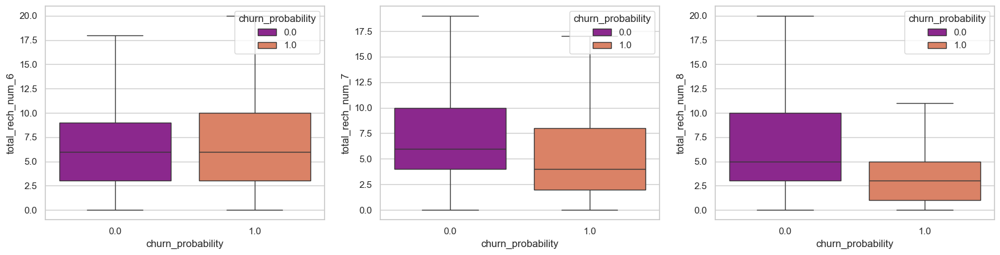

In [340]:
# plot for total_rech_num for month 6, 7 and 8 months
plt.figure(figsize=(20,10))
temp_data = eda_telecom_df
plt.subplot(2,3,1)
sns.boxplot(data=temp_data, y="total_rech_num_6",x="churn_probability",hue="churn_probability",
showfliers=False,palette=("plasma"))
plt.subplot(2,3,2)
sns.boxplot(data=temp_data, y="total_rech_num_7",x="churn_probability",hue="churn_probability",
                showfliers=False,palette=("plasma"))
plt.subplot(2,3,3)
sns.boxplot(data=temp_data, y="total_rech_num_8",x="churn_probability",hue="churn_probability",
                showfliers=False,palette=("plasma"))
plt.show()

#### Observation:
          Major drop in total recharge number for churned customers in the 8th Month

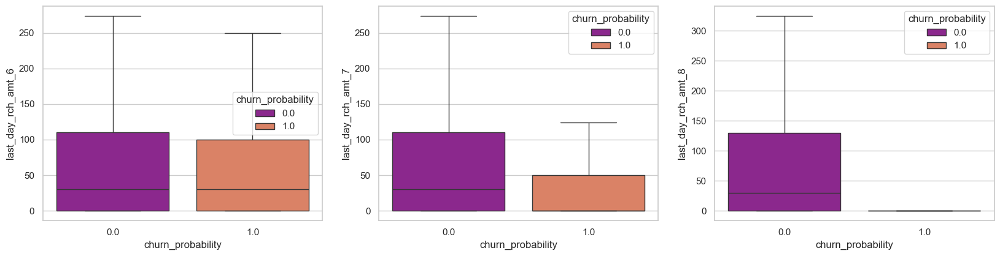

In [341]:
# plot for last_day_rch_amt for month 6, 7 and 8 month
plt.figure(figsize=(20,10))
temp_data = eda_telecom_df
plt.subplot(2,3,1)
sns.boxplot(data=temp_data, y="last_day_rch_amt_6",x="churn_probability",hue="churn_probability",
showfliers=False,palette=("plasma"))
plt.subplot(2,3,2)
sns.boxplot(data=temp_data, y="last_day_rch_amt_7",x="churn_probability",hue="churn_probability",
                showfliers=False,palette=("plasma"))
plt.subplot(2,3,3)
sns.boxplot(data=temp_data, y="last_day_rch_amt_8",x="churn_probability",hue="churn_probability",
                showfliers=False,palette=("plasma"))
plt.show()

#### Observation:
          Also zero count for last day of recharge amount for churned customers in the 8th Month

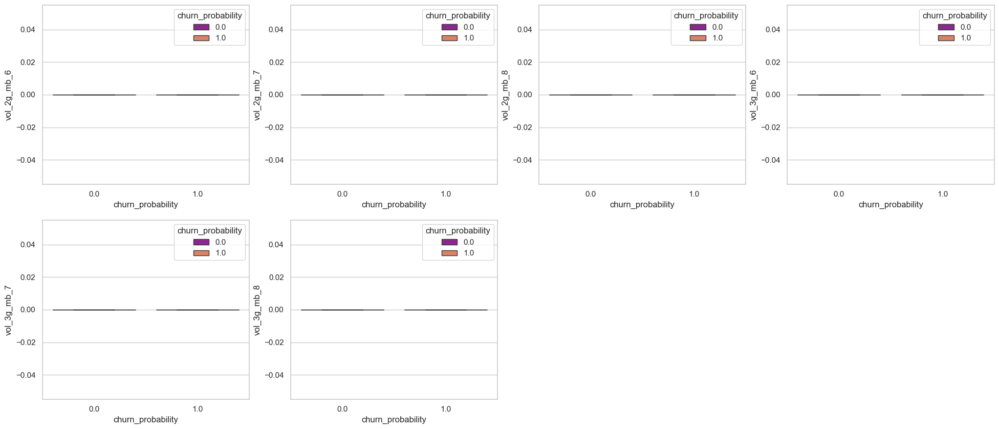

In [342]:
# plot for vol_2g_mb and vol_3g_mb for month 6, 7 and 8 month
plt.figure(figsize=(24,10))
temp_data = eda_telecom_df
plt.subplot(2,4,1)
sns.boxplot(data=temp_data, y="vol_2g_mb_6",x="churn_probability",hue="churn_probability",
showfliers=False,palette=("plasma"))
plt.subplot(2,4,2)
sns.boxplot(data=temp_data, y="vol_2g_mb_7",x="churn_probability",hue="churn_probability",
                showfliers=False,palette=("plasma"))
plt.subplot(2,4,3)
sns.boxplot(data=temp_data, y="vol_2g_mb_8",x="churn_probability",hue="churn_probability",
                showfliers=False,palette=("plasma"))
plt.subplot(2,4,4)
sns.boxplot(data=temp_data, y="vol_3g_mb_6",x="churn_probability",hue="churn_probability",
showfliers=False,palette=("plasma"))
plt.subplot(2,4,5)
sns.boxplot(data=temp_data, y="vol_3g_mb_7",x="churn_probability",hue="churn_probability",
                showfliers=False,palette=("plasma"))
plt.subplot(2,4,6)
sns.boxplot(data=temp_data, y="vol_3g_mb_8",x="churn_probability",hue="churn_probability",
                showfliers=False,palette=("plasma"))
plt.show()

#### Observation:
          Nothing can be inferred from vol_2g_mb and vol_3g_mb for month 6, 7 and 8 month as range is very low.

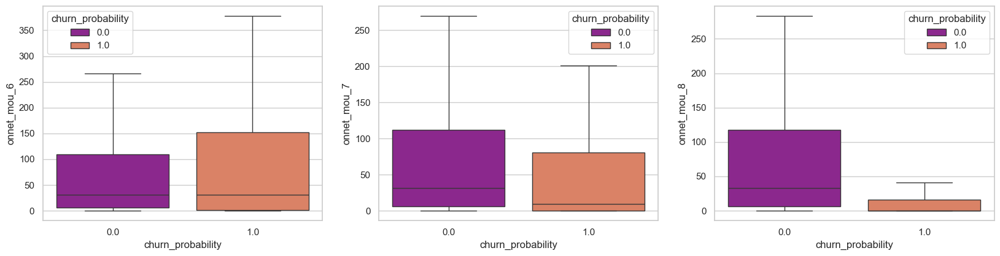

In [343]:
# plot for onnet_mou for month 6, 7 and 8 month
plt.figure(figsize=(20,10))
temp_data = eda_telecom_df
plt.subplot(2,3,1)
sns.boxplot(data=temp_data, y="onnet_mou_6",x="churn_probability",hue="churn_probability",
showfliers=False,palette=("plasma"))
plt.subplot(2,3,2)
sns.boxplot(data=temp_data, y="onnet_mou_7",x="churn_probability",hue="churn_probability",
                showfliers=False,palette=("plasma"))
plt.subplot(2,3,3)
sns.boxplot(data=temp_data, y="onnet_mou_8",x="churn_probability",hue="churn_probability",
                showfliers=False,palette=("plasma"))
plt.show()

#### Observation:
          Onnet calls duration heavility decreae for chured custmers during 8th month

In [344]:
# Collecting call related data for 6th month
mou_og_cols_month6 = eda_telecom_df.columns[eda_telecom_df.columns.str.contains('.*_og_.*mou_6',regex=True)]

In [345]:
eda_telecom_df.loc[:,mou_og_cols_month6].describe()

,roam_og_mou_6,loc_og_t2t_mou_6,loc_og_t2m_mou_6,loc_og_t2f_mou_6,loc_og_t2c_mou_6,loc_og_mou_6,std_og_t2t_mou_6,std_og_t2m_mou_6,std_og_t2f_mou_6,std_og_mou_6,isd_og_mou_6,spl_og_mou_6,total_og_mou_6
count,"69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00","69,999.00"
mean,13.63,45.05,89.55,3.60,1.08,138.20,77.43,84.67,1.08,163.18,0.81,3.80,306.45
std,72.06,148.24,159.85,13.07,5.63,248.59,250.50,251.25,7.98,385.64,29.15,15.56,465.50
min,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,0.00,1.01,7.29,0.00,0.00,12.96,0.00,0.00,0.00,0.00,0.00,0.00,44.78
50%,0.00,10.66,37.68,0.00,0.00,59.99,0.00,2.91,0.00,9.25,0.00,0.00,145.28
75%,0.00,38.68,105.69,1.86,0.00,161.49,27.16,49.15,0.00,133.89,0.00,2.15,374.30
max,"3,775.11","6,431.33","4,696.83",617.58,342.86,"10,643.38","7,366.58","8,314.76",628.56,"8,432.99","5,900.66","1,023.21","10,674.03"


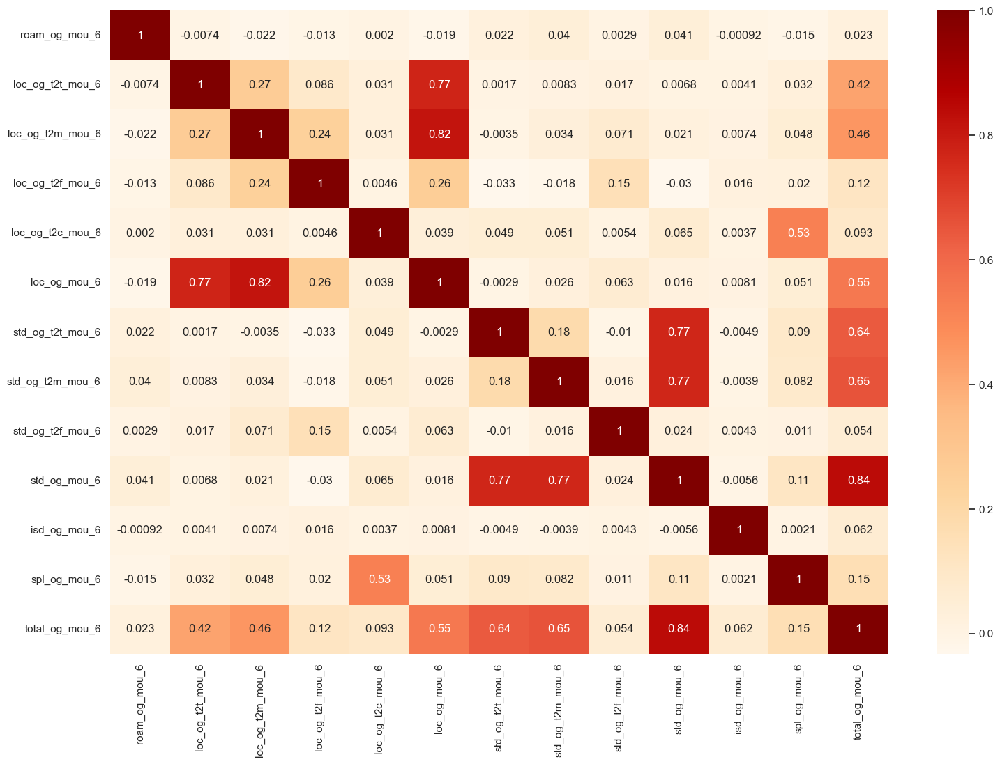

In [346]:
# Hitmap
plt.figure(figsize=(18,12))
sns.heatmap(eda_telecom_df.filter(mou_og_cols_month6).corr(),cmap="OrRd",annot=True)
plt.show()

#### Observation:
          Looks like total_og_mou_6, std_og_mou_6 and loc_og_mou_6 have strong correlation with other fileds and require investigation to avoid any multicolinearity.

In [347]:
num_features = ['arpu_6',
 'arpu_7',
 'arpu_8',
 'onnet_mou_8',
 'offnet_mou_7',
 'offnet_mou_8',
 'roam_ic_mou_8',
 'roam_og_mou_8',
 'loc_og_t2t_mou_8',
 'loc_og_t2m_mou_8',
 'loc_og_mou_7',
 'loc_og_mou_8',
 'loc_ic_t2t_mou_7',
 'loc_ic_t2t_mou_8',
 'loc_ic_t2m_mou_7',
 'loc_ic_t2m_mou_8',
 'loc_ic_mou_7',
 'loc_ic_mou_8',
 'std_ic_t2m_mou_8',
 'total_rech_num_7',
 'total_rech_num_8',
 'max_rech_amt_8',
 'last_day_rch_amt_8',
 'aon',
 'churn_probability']

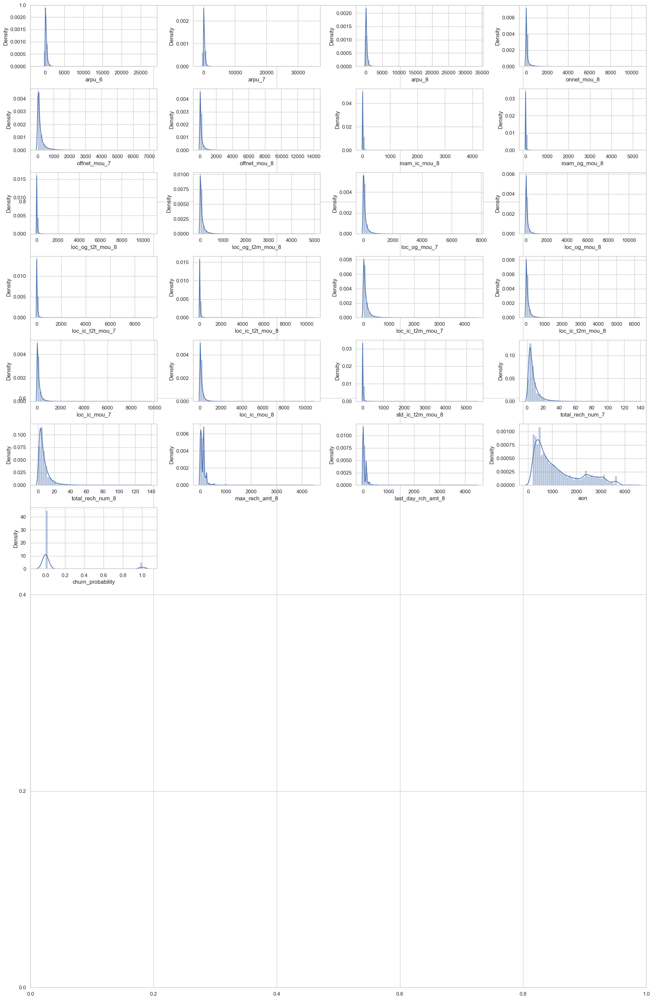

In [348]:
#Visualizing the distribution of numerical variables
fig=plt.subplots(figsize=(20, 30))

for i, feature in enumerate(num_features):
    plt.subplot(12, 4, i+1)
    sns.distplot(eda_telecom_df[feature])
    plt.tight_layout()

#### Observation:
          Distribution in all the plots loooks good.

## Step 3 :  Feature Engineering and Variable Conversion

#### High Value Customer Churn Analysis

In [349]:
# df for high value customers based on average revenue per month
high_value_cust_df = telecom_df.copy()

In [350]:
#Create new column containing sum of average revenue for 6,7,8 month
high_value_cust_df['arpu'] = high_value_cust_df['arpu_6'] + high_value_cust_df['arpu_7'] + high_value_cust_df['arpu_8']

In [351]:
# filtering top 40 percentile data
limit = high_value_cust_df['arpu'].quantile(0.6)
high_value_cust_df = high_value_cust_df[high_value_cust_df['arpu']>limit]

In [352]:
high_value_cust_corr = high_value_cust_df[high_value_cust_df['churn_probability']==1]
print(len(high_value_cust_corr))
high_value_cust_df.head(5)

1924


,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability,arpu
11,292.72,228.75,418.23,135.54,63.61,177.36,46.39,65.48,92.81,0.00,0.00,0.00,0.00,0.00,0.00,86.39,27.59,82.33,43.28,29.49,83.54,0.58,0.36,0.00,2.53,0.00,0.00,130.26,57.46,165.88,49.14,36.01,95.03,0.00,35.61,9.26,0.00,0.00,0.00,49.14,71.63,104.29,0.00,0.00,0.00,2.53,0.00,0.35,0.00,0.00,0.00,181.94,129.09,270.53,66.34,62.03,115.13,60.46,45.23,61.26,0.38,0.00,0.41,127.19,107.26,176.81,6.73,44.76,86.19,0.00,2.65,18.96,0.00,0.00,0.00,6.73,47.41,105.16,133.93,154.68,281.98,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,10.00,6.00,8.00,410.00,220.00,460.00,110.00,50.00,130.00,110.00,50.00,50.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,648.00,0.00,0.00,0.00,0.00,939.71
12,439.92,397.95,392.02,244.46,108.31,42.98,571.98,727.91,644.43,0.00,0.00,0.00,0.00,0.00,0.00,0.00,7.86,3.98,44.01,13.93,51.24,0.00,0.00,0.00,0.00,0.00,0.00,44.01,21.79,55.23,244.46,100.44,38.99,527.96,713.98,593.18,0.00,0.00,0.00,772.43,814.43,632.18,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,816.44,836.23,687.41,0.00,0.53,1.06,26.93,25.68,23.46,0.00,0.00,0.00,26.93,26.21,24.53,0.23,0.00,0.00,7.33,8.64,2.46,0.00,0.48,0.00,7.56,9.13,2.46,34.49,35.34,26.99,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,15.00,10.00,20.00,521.00,418.00,365.00,110.00,110.00,50.00,110.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,322.00,0.00,0.00,0.00,0.00,"1,229.89"
15,580.55,377.29,338.29,10.43,24.99,194.43,317.11,341.79,197.09,0.00,0.00,0.00,0.00,0.00,0.00,10.43,24.99,194.43,313.76,330.88,185.88,3.26,10.91,4.94,0.00,0.00,0.00,327.46,366.79,385.26,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,6.26,0.00,0.00,6.26,0.00,0.00,0.00,0.08,0.00,0.00,0.10,0.00,0.00,327.64,366.79,391.53,13.86,20.18,335.43,219.31,754.24,285.63,0.00,1.93,8.88,233.18,776.36,629.94,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.03,0.00,0.00,1.03,0.00,233.18,777.39,629.94,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,5.00

#### Observation:
         Few records of high value customers.
         We cannot used it for modelling, but can be inferred  to analyze general trend

<Axes: xlabel='churn_probability', ylabel='arpu'>

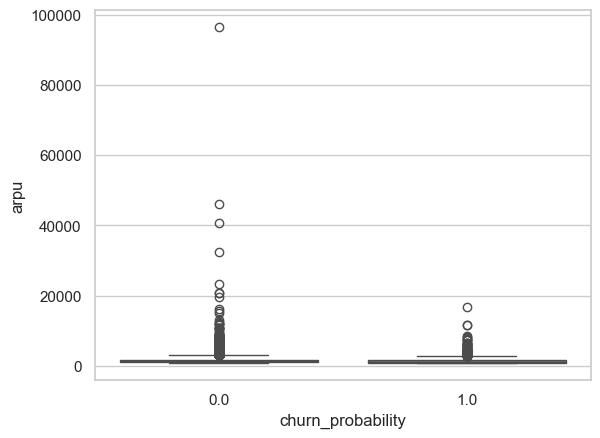

In [353]:
# Plotting Average revenue per user
sns.boxplot(x="churn_probability", y="arpu", data=high_value_cust_df)

#### Observation:
         No clear inference 

#### Observations:
- decreasing trend for average revenue per user for churned customers from the month of june to august
 - decreasing trend for mou features like onnet_mou, offnet_mou, loc_og_t2t_mou etc
 - Average tenure on network - aon is less for churned customers.So, new customers are more likely to churn
 - We can infer that customers who have reducing trend wrt usage of services and is new on network,he/she is most likely to be in churn category

### Correlation Analyis

In [354]:
# Plotting cluster map to check correlation between features
#sns.clustermap(telecom_df.corr(), annot=True, cmap="RdBu", figsize=(200,200))

In [355]:
def remove_highly_correlated_features(df, threshold=0.85):
    # Calculate the correlation matrix
    corr_matrix = df.corr().abs()

    # Create a mask to identify highly correlated features
    mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

    # Find index of feature columns with correlation greater than the threshold
    collinear_features = [column for column in range(len(corr_matrix.columns)) if any(corr_matrix.iloc[column, column + 1:] > threshold)]

    # Drop the highly correlated features
    df.drop(df.columns[collinear_features], axis=1, inplace=True)

In [356]:
# dropping highly correlated columns
telecom_df_removed_corr_85 = telecom_df.copy()

In [357]:
remove_highly_correlated_features(telecom_df_removed_corr_85,0.85)

In [358]:
telecom_df_removed_corr_85.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69999 entries, 0 to 69998
Columns: 113 entries, offnet_mou_6 to churn_probability
dtypes: float64(113)
memory usage: 60.3 MB


#### Observation
        As we have high number of columns/features, we will either use Random Forest or RFE

## Step 4 :  Model Selection, Model Building, and Prediction

### Feature Selection using Random Forest Classifier

In [359]:
feature_telecom_rfc = telecom_df_removed_corr_85.copy()
y = feature_telecom_rfc.pop('churn_probability')
X = feature_telecom_rfc

# using stratified splitting to maintain similar percentage of churned customers
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify = y, random_state=42)

In [360]:
feature_names_rfc = [f"feature {i}" for i in range(X.shape[1])]
random_forest = RandomForestClassifier(random_state=0)
random_forest.fit(X_train, y_train)

RandomForestClassifier(random_state=0)

count                 112.00
mean                    0.01
std                     0.01
min                     0.00
25%                     0.00
50%                     0.01
75%                     0.01
max                     0.10
dtype: float64

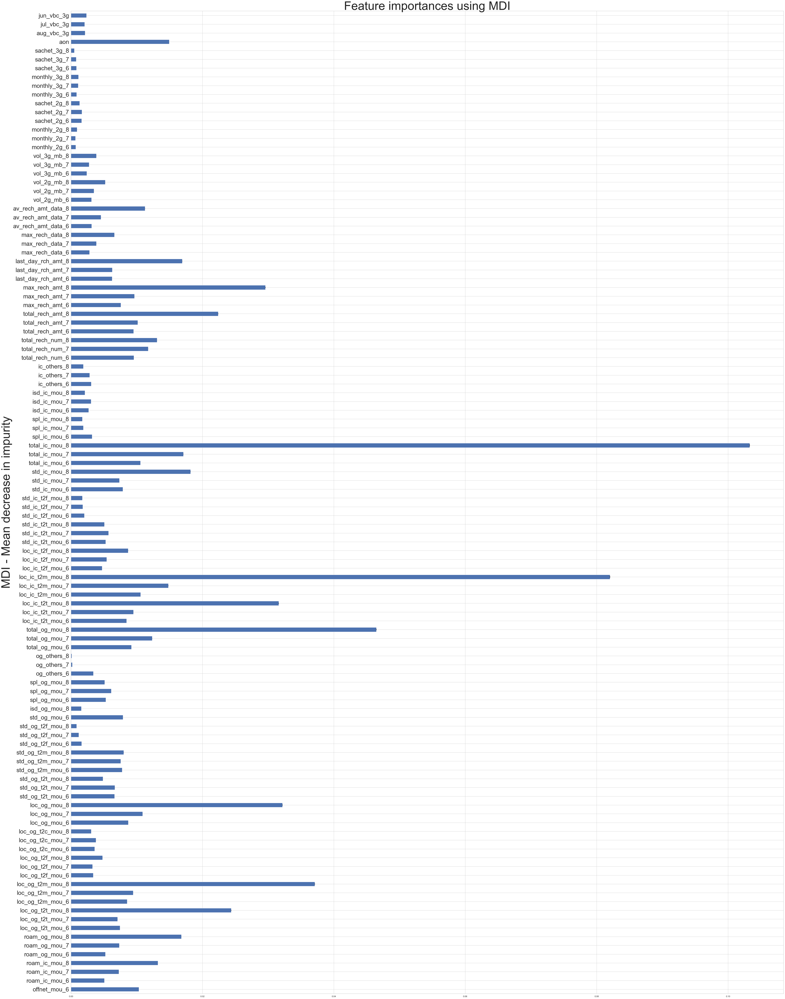

In [361]:
# plotting features based on Mean Decrease in Immunity
importances = random_forest.feature_importances_
std = np.std([tree.feature_importances_ for tree in random_forest.estimators_], axis=0)
forest_importances = pd.Series(importances, index=X_train.columns)

fig, ax = plt.subplots(figsize=(55,70))
forest_importances.plot.barh(yerr=std, ax=ax)
ax.set_title("Feature importances using MDI", fontsize = 60)
ax.set_ylabel("MDI - Mean decrease in impurity", fontsize = 60)
ax.tick_params(axis='y', labelsize=30)
fig.tight_layout()
forest_importances.describe()

In [362]:
# selecting the most important features
impact_feature_imp_df = pd.DataFrame(forest_importances)
impact_feature_imp_df.reset_index(inplace=True)
impact_feature_imp_df.columns=['features',"importance"]
len(impact_feature_imp_df[impact_feature_imp_df['importance'] > 0.01])

25

In [363]:
impact_feature_imp_df = impact_feature_imp_df[impact_feature_imp_df['importance']>0.01]
imp_feature_cols = list(impact_feature_imp_df.features)
imp_feature_cols.append('churn_probability')
imp_feature_cols

['offnet_mou_6',
 'roam_ic_mou_8',
 'roam_og_mou_8',
 'loc_og_t2t_mou_8',
 'loc_og_t2m_mou_8',
 'loc_og_mou_7',
 'loc_og_mou_8',
 'total_og_mou_7',
 'total_og_mou_8',
 'loc_ic_t2t_mou_8',
 'loc_ic_t2m_mou_6',
 'loc_ic_t2m_mou_7',
 'loc_ic_t2m_mou_8',
 'std_ic_mou_8',
 'total_ic_mou_6',
 'total_ic_mou_7',
 'total_ic_mou_8',
 'total_rech_num_7',
 'total_rech_num_8',
 'total_rech_amt_7',
 'total_rech_amt_8',
 'max_rech_amt_8',
 'last_day_rch_amt_8',
 'av_rech_amt_data_8',
 'aon',
 'churn_probability']

In [364]:
# new df with feature selection
telecom_impact_feature_df = telecom_df_removed_corr_85[imp_feature_cols].dropna()

In [365]:
telecom_impact_feature_df.head()

,offnet_mou_6,roam_ic_mou_8,roam_og_mou_8,loc_og_t2t_mou_8,loc_og_t2m_mou_8,loc_og_mou_7,loc_og_mou_8,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_rech_num_7,total_rech_num_8,total_rech_amt_7,total_rech_amt_8,max_rech_amt_8,last_day_rch_amt_8,av_rech_amt_data_8,aon,churn_probability
0,32.24,0.00,0.00,0.28,2.33,16.04,2.61,221.68,3.63,7.79,0.83,21.08,16.91,15.18,11.84,53.04,40.56,2.00,2.00,65.00,10.00,10.00,0.00,0.00,"1,958.00",0.00
1,0.00,0.00,0.00,0.00,0.00,0.00,0.00,30.73,31.66,10.53,1.41,18.68,11.09,0.00,3.44,39.44,25.04,4.00,5.00,145.00,50.00,50.00,0.00,0.00,710.00,0.00
2,53.99,0.00,0.00,0.00,0.00,12.98,0.00,99.36,0.00,6.49,89.86,25.18,23.51,6.38,124.29,33.83,36.64,4.00,2.00,120.00,0.00,0.00,0.00,0.00,882.00,0.00
3,68.76,0.00,1.63,0.00,23.63,48.84,23.63,95.98,53.84,23.88,53.99,44.23,57.14,2.81,95.11,50.18,83.84,4.00,3.00,240.00,130.00,50.00,50.00,0.00,982.00,0.00
4,56.99,0.00,0.00,6.13,4.61,25.94,15.76,42.94,15.76,2.66,10.58,4.33,19.49,0.00,21.54,9.36,28.31,10.00,8.00,136.00,122.00,30.00,30.00,142.00,647.00,0.00


#### Splitting the data

In [366]:
# train-test split in the ratio 80-20
y=telecom_impact_feature_df.pop('churn_probability')
X=telecom_impact_feature_df
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8, test_size=0.2, random_state=100)

#### Scaling the data

In [367]:
scaler = StandardScaler()

In [368]:
X_train_scaled = scaler.fit_transform(X_train)
X_train_scaled_df = pd.DataFrame(X_train_scaled, columns=X_train.columns)
# checking for scaled data
X_train_scaled_df.describe()

,offnet_mou_6,roam_ic_mou_8,roam_og_mou_8,loc_og_t2t_mou_8,loc_og_t2m_mou_8,loc_og_mou_7,loc_og_mou_8,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_rech_num_7,total_rech_num_8,total_rech_amt_7,total_rech_amt_8,max_rech_amt_8,last_day_rch_amt_8,av_rech_amt_data_8,aon
count,"55,999.00","55,999.00","55,999.00","55,999.00","55,999.00","55,999.00","55,999.00","55,999.00","55,999.00","55,999.00","55,999.00","55,999.00","55,999.00","55,999.00","55,999.00","55,999.00","55,999.00","55,999.00","55,999.00","55,999.00","55,999.00","55,999.00","55,999.00","55,999.00","55,999.00"
mean,0.00,0.00,-0.00,-0.00,0.00,-0.00,-0.00,0.00,0.00,0.00,-0.00,0.00,0.00,-0.00,0.00,-0.00,-0.00,0.00,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00
std,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00
min,-0.61,-0.13,-0.14,-0.29,-0.57,-0.55,-0.55,-0.65,-0.63,-0.32,-0.62,-0.63,-0.63,-0.31,-0.69,-0.68,-0.69,-1.09,-1.00,-0.77,-0.74,-0.86,-0.61,-0.39,-1.09
25%,-0.52,-0.13,-0.14,-0.28,-0.53,-0.50,-0.50,-0.56,-0.55,-0.31,-0.53,-0.53,-0.55,-0.31,-0.56,-0.54,-0.56,-0.67,-0.59,-0.53,-0.53,-0.62,-0.61,-0.39,-0.79
50%,-0.33,-0.13,-0.14,-0.22,-0.34,-0.32,-0.32,-0.35,-0.35,-0.22,-0.30,-0.30,-0.31,-0.26,-0.29,-0.29,-0.29,-0.24,-0.31,-0.24,-0.23,-0.08,-0.32,-0.39,-0.37
75%,0.10,-0.13,-0.14,-0.04,0.11,0.09,0.10,0.14,0.14,-0.01,0.14,0.15,0.16,-0.06,0.18,0.16,0.18,0.32,0.25,0.26,0.25,0.29,0.66,-0.23,0.62
max,18.44,78.83,81.68,70.89,32.53,30.80,45.28,16.52,28.66,76.60,26.09,26.58,38.27,38.51,23.93,32.17,37.17,18.39,16.61,95.40,102.23,26.36,32.82,30.36,3.26


In [369]:
# scalar transform for test data
X_test_scaled = scaler.transform(X_test)
X_test_scaled_df = pd.DataFrame(X_test_scaled, columns=X_test.columns)
# checking
X_test_scaled_df.describe()

,offnet_mou_6,roam_ic_mou_8,roam_og_mou_8,loc_og_t2t_mou_8,loc_og_t2m_mou_8,loc_og_mou_7,loc_og_mou_8,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_rech_num_7,total_rech_num_8,total_rech_amt_7,total_rech_amt_8,max_rech_amt_8,last_day_rch_amt_8,av_rech_amt_data_8,aon
count,"14,000.00","14,000.00","14,000.00","14,000.00","14,000.00","14,000.00","14,000.00","14,000.00","14,000.00","14,000.00","14,000.00","14,000.00","14,000.00","14,000.00","14,000.00","14,000.00","14,000.00","14,000.00","14,000.00","14,000.00","14,000.00","14,000.00","14,000.00","14,000.00","14,000.00"
mean,0.01,-0.00,-0.01,0.00,0.01,-0.00,0.00,0.00,0.01,-0.00,0.00,0.00,0.02,0.01,0.01,0.00,0.01,-0.00,0.00,-0.00,0.00,0.01,0.00,0.00,0.01
std,1.05,0.92,0.81,0.96,1.01,0.96,1.00,1.00,0.98,0.96,0.99,0.99,1.07,1.21,1.05,1.03,1.04,0.98,0.99,0.90,0.83,0.98,1.02,0.95,1.00
min,-0.61,-0.13,-0.14,-0.29,-0.57,-0.55,-0.55,-0.65,-0.63,-0.32,-0.62,-0.63,-0.63,-0.31,-0.69,-0.68,-0.69,-1.09,-1.00,-0.77,-0.74,-0.86,-0.61,-0.39,-1.09
25%,-0.52,-0.13,-0.14,-0.28,-0.53,-0.50,-0.50,-0.56,-0.55,-0.31,-0.53,-0.53,-0.54,-0.31,-0.55,-0.54,-0.55,-0.67,-0.59,-0.53,-0.51,-0.62,-0.61,-0.39,-0.79
50%,-0.32,-0.13,-0.14,-0.22,-0.33,-0.31,-0.31,-0.35,-0.34,-0.22,-0.29,-0.30,-0.30,-0.26,-0.29,-0.29,-0.29,-0.24,-0.31,-0.24,-0.21,-0.06,-0.32,-0.39,-0.36
75%,0.11,-0.13,-0.14,-0.04,0.13,0.09,0.10,0.16,0.15,-0.01,0.15,0.15,0.18,-0.05,0.18,0.16,0.19,0.32,0.25,0.26,0.26,0.29,0.66,-0.22,0.65
max,26.36,43.68,26.23,46.12,23.09,25.67,31.25,16.65,15.67,24.45,19.73,18.75,34.95,55.59,26.16,24.53,20.52,14.58,18.14,20.92,15.40,34.76,43.15,13.96,3.28


### Model Building 

### 1. Logistic Regression after Random Forest feature selection

In [372]:
# Logistic regression model
# Logistic regression model
model_columns = list(X_train_scaled_df.columns)
model_columns=['const'] + model_columns
logm1 = sm.GLM(y_train,(sm.add_constant(X_train_scaled)), family = sm.families.Binomial())
logm1.fit().summary(xname=model_columns)


<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:      churn_probability   No. Observations:                55999
Model:                            GLM   Df Residuals:                    55973
Model Family:                Binomial   Df Model:                           25
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -12974.
Date:                Wed, 03 Apr 2024   Deviance:                       25949.
Time:                        20:55:36   Pearson chi2:                 8.08e+11
No. Iterations:                     9   Pseudo R-squ. (CS):             0.1794
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -4.2377      0.050    -84.544      0.000      -4.336      -4.139
offnet_mou_6           0.1507      0.020      7.695      0.000       0.112       0.189
roam_ic_mou_8          0.0392      0.014      2.794      0.005       0.012       0.067
roam_og_mou_8          0.1733      0.018      9.462      0.000       0.137       0.209
loc_og_t2t_mou_8       1.2194      0.668      1.825      0.068      -0.090       2.529
loc_og_t2m_mou_8       1.1154      0.665      1.677      0.094      -0.189       2.419
loc_og_mou_7           0.0132      0.052      0.253      0.800      -0.089       0.115
loc_og_mou_8          -2.7005      1.042     -2.593      0.010      -4.742      -0.659
total_og_mou_7         0.1461      0.036      4.041      0.000       0.075       0.217
total_og_mou_8        -0.2250      0.057     -3.968      0.000      -0.336      -0.114
loc_ic_t2t_mou_8      -0.9120      0.137     -6.664      0.000      -1.180      -0.644
loc_ic_t2m_mou_6       0.0058      0.046      0.126      0.900      -0.085       0.096
loc_ic_t2m_mou_7       0.0419      0.068      0.619      0.536      -0.091       0.175
loc_ic_t2m_mou_8      -2.3938      0.151    -15.874      0.000      -2.689      -2.098
std_ic_mou_8          -0.3691      0.077     -4.817      0.000      -0.519      -0.219
total_ic_mou_6         0.2321      0.043      5.408      0.000       0.148       0.316
total_ic_mou_7         0.1912      0.059      3.245      0.001       0.076       0.307
total_ic_mou_8        -0.4985      0.152     -3.281      0.001      -0.796      -0.201
total_rech_num_7       0.1244      0.029      4.295      0.000       0.068       0.181
total_rech_num_8      -0.9933      0.048    -20.649      0.000      -1.088      -0.899
total_rech_amt_7       0.0628      0.037      1.687      0.092      -0.010       0.136
total_rech_amt_8       0.0596      0.071      0.837      0.402      -0.080       0.199
max_rech_amt_8        -0.1089      0.039     -2.780      0.005      -0.186      -0.032
last_day_rch_amt_8    -0.5233      0.041    -12.887      0.000      -0.603      -0.444
av_rech_amt_data_8    -0.4623      0.041    -11.363      0.000      -0.542      -0.383
aon                   -0.3021      0.021    -14.475      0.000      -0.343      -0.261
======================================================================================
"""

#### Observation:
        - Most of the p values are either zero or near to zero,making many of the features insignificant
        - We will take the top 15 feature using RFE

### 2. Logistic Regression with RFE

In [373]:
lr = LogisticRegression()

In [429]:
# fitting RFE for top 15 features
rfe = RFE(lr, n_features_to_select=15)
rfe = rfe.fit(X_train_scaled, y_train)

In [430]:
rfe_top_cols = X_train_scaled_df.columns[rfe.support_]
rfe.support_

array([False, False,  True,  True,  True, False,  True,  True,  True,
        True, False, False,  True,  True,  True, False,  True, False,
        True, False, False, False,  True,  True,  True])

In [431]:
# checking RFE columns
list(zip(X_train_scaled_df.columns, rfe.support_, rfe.ranking_))

[('offnet_mou_6', False, 3),
 ('roam_ic_mou_8', False, 9),
 ('roam_og_mou_8', True, 1),
 ('loc_og_t2t_mou_8', True, 1),
 ('loc_og_t2m_mou_8', True, 1),
 ('loc_og_mou_7', False, 10),
 ('loc_og_mou_8', True, 1),
 ('total_og_mou_7', True, 1),
 ('total_og_mou_8', True, 1),
 ('loc_ic_t2t_mou_8', True, 1),
 ('loc_ic_t2m_mou_6', False, 11),
 ('loc_ic_t2m_mou_7', False, 8),
 ('loc_ic_t2m_mou_8', True, 1),
 ('std_ic_mou_8', True, 1),
 ('total_ic_mou_6', True, 1),
 ('total_ic_mou_7', False, 2),
 ('total_ic_mou_8', True, 1),
 ('total_rech_num_7', False, 4),
 ('total_rech_num_8', True, 1),
 ('total_rech_amt_7', False, 6),
 ('total_rech_amt_8', False, 7),
 ('max_rech_amt_8', False, 5),
 ('last_day_rch_amt_8', True, 1),
 ('av_rech_amt_data_8', True, 1),
 ('aon', True, 1)]

In [475]:
# top 15 features
rfe_cols = list(rfe_top_cols)
X_train_rfe = scaler.fit_transform(X_train[rfe_cols])
features = ['const'] + list(rfe_cols)
features

['const',
 'roam_og_mou_8',
 'loc_og_t2t_mou_8',
 'loc_og_t2m_mou_8',
 'loc_og_mou_8',
 'total_og_mou_7',
 'total_og_mou_8',
 'loc_ic_t2t_mou_8',
 'loc_ic_t2m_mou_8',
 'std_ic_mou_8',
 'total_ic_mou_6',
 'total_ic_mou_8',
 'total_rech_num_8',
 'last_day_rch_amt_8',
 'av_rech_amt_data_8',
 'aon']

In [476]:
X_train_sm = sm.add_constant(X_train_rfe)
logm2 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm2.fit()
res.summary(xname=features)

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:      churn_probability   No. Observations:                55999
Model:                            GLM   Df Residuals:                    55983
Model Family:                Binomial   Df Model:                           15
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -13043.
Date:                Wed, 03 Apr 2024   Deviance:                       26086.
Time:                        22:45:02   Pearson chi2:                 2.65e+12
No. Iterations:                     9   Pseudo R-squ. (CS):             0.1774
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -4.2640      0.050    -85.593      0.000      -4.362      -4.166
roam_og_mou_8          0.2100      0.014     15.505      0.000       0.183       0.237
loc_og_t2t_mou_8       1.3490      0.677      1.993      0.046       0.022       2.675
loc_og_t2m_mou_8       1.3460      0.674      1.997      0.046       0.025       2.667
loc_og_mou_8          -3.0044      1.054     -2.851      0.004      -5.070      -0.939
total_og_mou_7         0.3686      0.025     14.946      0.000       0.320       0.417
total_og_mou_8        -0.3216      0.049     -6.577      0.000      -0.417      -0.226
loc_ic_t2t_mou_8      -0.9454      0.134     -7.037      0.000      -1.209      -0.682
loc_ic_t2m_mou_8      -2.4004      0.133    -18.089      0.000      -2.661      -2.140
std_ic_mou_8          -0.3787      0.075     -5.045      0.000      -0.526      -0.232
total_ic_mou_6         0.3791      0.026     14.573      0.000       0.328       0.430
total_ic_mou_8        -0.3871      0.135     -2.873      0.004      -0.651      -0.123
total_rech_num_8      -0.8937      0.039    -22.684      0.000      -0.971      -0.816
last_day_rch_amt_8    -0.5709      0.035    -16.132      0.000      -0.640      -0.502
av_rech_amt_data_8    -0.4974      0.038    -13.240      0.000      -0.571      -0.424
aon                   -0.3103      0.021    -14.955      0.000      -0.351      -0.270
======================================================================================
"""

In [477]:
# Function to calculate VIF
def get_vif(cols):
    df1 = X_train[cols]
    vif = pd.DataFrame()
    vif['Features'] = df1.columns
    vif['VIF'] = [variance_inflation_factor(df1.values, i) for i in range(df1.shape[1])]
    vif['VIF'] = round(vif['VIF'],2)
    print(vif.sort_values(by='VIF',ascending=False))

In [478]:
get_vif(rfe_cols)

              Features                  VIF
3         loc_og_mou_8               522.01
2     loc_og_t2m_mou_8               214.44
1     loc_og_t2t_mou_8               171.72
10      total_ic_mou_8                23.08
7     loc_ic_t2m_mou_8                 9.17
6     loc_ic_t2t_mou_8                 5.18
5       total_og_mou_8                 4.77
4       total_og_mou_7                 3.53
8         std_ic_mou_8                 3.41
9       total_ic_mou_6                 2.80
11    total_rech_num_8                 2.26
14                 aon                 1.85
12  last_day_rch_amt_8                 1.67
13  av_rech_amt_data_8                 1.25
0        roam_og_mou_8                 1.06


#### Observation:
        - The features like loc_og_mou_8, loc_og_t2m_mou_8, loc_og_t2t_mou_8 total_ic_mou_8 shows high VIF vaues and can be dropped.
        - We will drop these features as showing multicollnearity

In [479]:
rfe_cols.remove('loc_og_mou_8')
rfe_cols.remove('loc_og_t2m_mou_8')
rfe_cols.remove('loc_og_t2t_mou_8')
rfe_cols.remove('total_ic_mou_8')


In [480]:
print(rfe_cols)

['roam_og_mou_8', 'total_og_mou_7', 'total_og_mou_8', 'loc_ic_t2t_mou_8', 'loc_ic_t2m_mou_8', 'std_ic_mou_8', 'total_ic_mou_6', 'total_rech_num_8', 'last_day_rch_amt_8', 'av_rech_amt_data_8', 'aon']


In [481]:
X_train_rfe = scaler.fit_transform(X_train[rfe_cols])
features = ['const'] + list(rfe_cols)

In [482]:
get_vif(rfe_cols)

              Features                  VIF
2       total_og_mou_8                 4.21
1       total_og_mou_7                 3.52
6       total_ic_mou_6                 2.64
7     total_rech_num_8                 2.21
4     loc_ic_t2m_mou_8                 2.07
10                 aon                 1.81
8   last_day_rch_amt_8                 1.61
3     loc_ic_t2t_mou_8                 1.40
9   av_rech_amt_data_8                 1.24
5         std_ic_mou_8                 1.21
0        roam_og_mou_8                 1.05


#### Observation:
        - The features VIF values looks good and are in acceptable range

In [484]:
X_train_sm = sm.add_constant(X_train_rfe)
logm3 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm3.fit()
res.summary(xname=features)

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:      churn_probability   No. Observations:                55999
Model:                            GLM   Df Residuals:                    55987
Model Family:                Binomial   Df Model:                           11
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -13108.
Date:                Wed, 03 Apr 2024   Deviance:                       26216.
Time:                        22:52:29   Pearson chi2:                 1.60e+14
No. Iterations:                     9   Pseudo R-squ. (CS):             0.1755
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -4.2050      0.048    -86.826      0.000      -4.300      -4.110
roam_og_mou_8          0.2144      0.014     15.446      0.000       0.187       0.242
total_og_mou_7         0.3843      0.025     15.462      0.000       0.336       0.433
total_og_mou_8        -0.4688      0.049     -9.543      0.000      -0.565      -0.373
loc_ic_t2t_mou_8      -1.3875      0.115    -12.073      0.000      -1.613      -1.162
loc_ic_t2m_mou_8      -3.0192      0.095    -31.654      0.000      -3.206      -2.832
std_ic_mou_8          -0.5071      0.054     -9.316      0.000      -0.614      -0.400
total_ic_mou_6         0.3560      0.025     14.179      0.000       0.307       0.405
total_rech_num_8      -0.8763      0.039    -22.477      0.000      -0.953      -0.800
last_day_rch_amt_8    -0.6130      0.036    -17.210      0.000      -0.683      -0.543
av_rech_amt_data_8    -0.4961      0.037    -13.244      0.000      -0.569      -0.423
aon                   -0.3335      0.021    -16.241      0.000      -0.374      -0.293
======================================================================================
"""

In [485]:
# predictions
y_train_pred = res.predict(X_train_sm)
y_train_pred

array([3.98120634e-01, 1.06536756e-03, 4.03533853e-03, ...,
       8.09726998e-02, 2.67769909e-02, 6.94152899e-05])

In [486]:
# creating dataframe with true and predicted churn
y_train_pred_final_df = pd.DataFrame({'True_Churn':y_train.values, 'Churn_Prob':y_train_pred})
y_train_pred_final_df['Pred_Churn'] = y_train_pred_final_df.Churn_Prob.map(lambda x: 1 if x > 0.1 else 0)

In [487]:
y_train_pred_final_df

,True_Churn,Churn_Prob,Pred_Churn
0,1.00,0.40,1
1,0.00,0.00,0
2,0.00,0.00,0
3,0.00,0.00,0
4,0.00,0.02,0
5,0.00,0.00,0
6,1.00,0.47,1
7,0.00,0.04,0
8,0.00,0.00,0
9,0.00,0.00,0


In [492]:
confusion_matrix = metrics.confusion_matrix(y_train_pred_final_df.True_Churn, y_train_pred_final_df.Pred_Churn )
print(confusion_matrix)

[[37498 12761]
 [  799  4941]]


#### Computing Metrics

In [493]:
TP = confusion_matrix[1,1] # true positives
TN = confusion_matrix[0,0] # true negatives
FP = confusion_matrix[0,1] # false positives
FN = confusion_matrix[1,0] # false negatives

In [494]:
print("Train data Accuracy :",metrics.accuracy_score(y_train_pred_final_df.True_Churn, y_train_pred_final_df.Pred_Churn))
print("Senstivity/Recall: ",TP / float(TP+FN))
print("Specificity: ",TN / float(TN+FP))
print("FPR: ",FP/ float(TN+FP))
print("Precision:",TP / float(TP+FP))

Train data Accuracy : 0.7578528188003357
Senstivity/Recall:  0.860801393728223
Specificity:  0.7460952267255616
FPR:  0.2539047732744384
Precision: 0.27912100327646594


In [495]:
# Plotting the ROC curve.

def PLOT_ROC( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic')
    plt.legend(loc="lower right")
    plt.show()

    return None

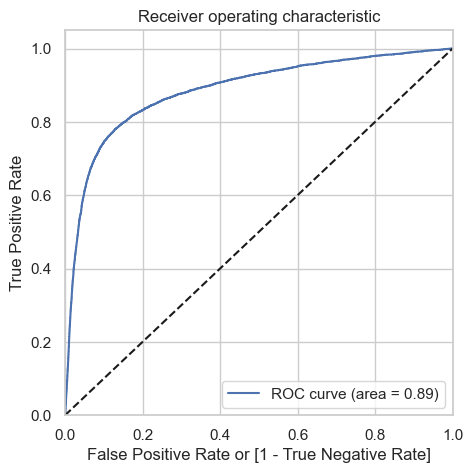

In [496]:
PLOT_ROC(y_train_pred_final_df.True_Churn, y_train_pred_final_df.Churn_Prob)

#### Selecting cutoff

In [498]:
# Select a cut off probability above which we will classify customer as churned
num = [float(x)/10 for x in range(10)]
for i in num:
    y_train_pred_final_df[i]= y_train_pred_final_df.Churn_Prob.map(lambda x: 1 if x > i else 0)
y_train_pred_final_df.head(100)

,True_Churn,Churn_Prob,Pred_Churn,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,1.00,0.40,1,1,1,1,1,0,0,0,0,0,0
1,0.00,0.00,0,1,0,0,0,0,0,0,0,0,0
2,0.00,0.00,0,1,0,0,0,0,0,0,0,0,0
3,0.00,0.00,0,1,0,0,0,0,0,0,0,0,0
4,0.00,0.02,0,1,0,0,0,0,0,0,0,0,0
5,0.00,0.00,0,1,0,0,0,0,0,0,0,0,0
6,1.00,0.47,1,1,1,1,1,1,0,0,0,0,0
7,0.00,0.04,0,1,0,0,0,0,0,0,0,0,0
8,0.00,0.00,0,1,0,0,0,0,0,0,0,0,0
9,0.00,0.00,0,1,0,0,0,0,0,0,0,0,0


In [499]:
# Lets check metrics at different cut-off
cut_off_df = pd.DataFrame(columns = ['cut_off','accuracy','sensitivity','specificity'])

# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [float(x)/10 for x in range(10)]
for i in num:
    c_m1 = metrics.confusion_matrix(y_train_pred_final_df.True_Churn, y_train_pred_final_df[i] )
    total1=sum(sum(c_m1))
    accuracy = (c_m1[0,0]+c_m1[1,1])/total1    
    speci = c_m1[0,0]/(c_m1[0,0]+c_m1[0,1])
    sensi = c_m1[1,1]/(c_m1[1,0]+c_m1[1,1])
    cut_off_df.loc[i] =[i,accuracy,sensi,speci]
cut_off_df

,cut_off,accuracy,sensitivity,specificity
0.00,0.00,0.10,1.00,0.00
0.10,0.10,0.76,0.86,0.75
0.20,0.20,0.87,0.77,0.88
0.30,0.30,0.91,0.65,0.94
0.40,0.40,0.92,0.41,0.98
0.50,0.50,0.90,0.14,0.99
0.60,0.60,0.90,0.05,1.00
0.70,0.70,0.90,0.03,1.00
0.80,0.80,0.90,0.01,1.00
0.90,0.90,0.90,0.00,1.00


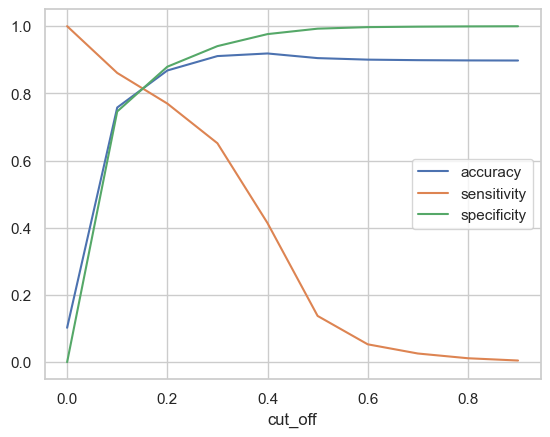

In [500]:
cut_off_df.plot.line(x='cut_off', y=['accuracy','sensitivity','specificity'])
plt.show()

In [501]:
y_train_pred_final_df = pd.DataFrame({'True_Churn':y_train.values, 'Churn_Prob':y_train_pred})
y_train_pred_final_df['Pred_Churn'] = y_train_pred_final_df.Churn_Prob.map(lambda x: 1 if x > 0.1 else 0)

In [507]:
print("Precision: ",precision_score(y_train_pred_final_df.True_Churn, y_train_pred_final_df.Pred_Churn))
print("Recall: ",recall_score(y_train_pred_final_df.True_Churn, y_train_pred_final_df.Pred_Churn))
print("F1 Score: ", f1_score(y_train_pred_final_df.True_Churn, y_train_pred_final_df.Pred_Churn))

Precision:  0.27912100327646594
Recall:  0.860801393728223
F1 Score:  0.4215510621960583


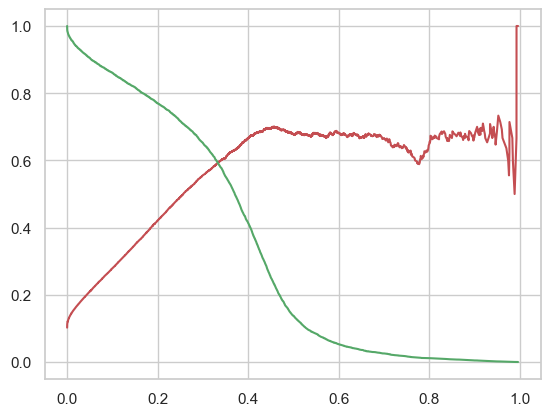

In [508]:
# Precision-Recall curve
p, r, thresholds = precision_recall_curve(y_train_pred_final_df.True_Churn, y_train_pred_final_df.Churn_Prob)
plt.plot(thresholds, p[:-1], "r-")
plt.plot(thresholds, r[:-1], "g-")
plt.show()

#### Prediction on Test Data

In [509]:
X_test_scaled = scaler.transform(X_test[rfe_cols])
X_test_sm = sm.add_constant(X_test_scaled)

In [510]:
y_test_pred = res.predict(X_test_sm)

In [513]:
y_pred_final = pd.DataFrame({'True_Churn':y_test, 'Churn_Prob':y_test_pred})
y_pred_final['Pred_Churn'] = y_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.1 else 0)
y_pred_final

,True_Churn,Churn_Prob,Pred_Churn
3425,1.00,0.61,1
33067,1.00,0.55,1
52420,0.00,0.37,1
5220,0.00,0.08,0
33958,1.00,0.24,1
9315,0.00,0.00,0
9796,0.00,0.01,0
7084,0.00,0.00,0
62263,0.00,0.10,1
47921,0.00,0.89,1


In [514]:
confusion_test = metrics.confusion_matrix(y_pred_final.True_Churn, y_pred_final.Pred_Churn )
confusion_test

array([[9478, 3130],
       [ 202, 1190]], dtype=int64)

In [515]:
TP = confusion_test[1,1] # true positive 
TN = confusion_test[0,0] # true negatives
FP = confusion_test[0,1] # false positives
FN = confusion_test[1,0] # false negatives

In [516]:
print("Test data Accuracy :",metrics.accuracy_score(y_pred_final.True_Churn, y_pred_final.Pred_Churn))
print("Senstivity/Recall: ",TP / float(TP+FN))
print("Specificity: ",TN / float(TN+FP))
print("FPR: ",FP/ float(TN+FP))
print("Precision:",TP / float(TP+FP))

Test data Accuracy : 0.762
Senstivity/Recall:  0.8548850574712644
Specificity:  0.7517449238578681
FPR:  0.248255076142132
Precision: 0.27546296296296297


In [563]:
# creating a dataframe for model selection
evaluation_model_df = pd.DataFrame(data=np.zeros((5,2)), index=['Logistic Reg', 'GBM', 'Logistic Reg with PCA', 'XGBoost', 'Random Forest'], columns=['Accuracy', 'Sensitivity'])
evaluation_model_df.loc['Logistic Reg', 'Accuracy'] = round(metrics.accuracy_score(y_pred_final.True_Churn, y_pred_final.Pred_Churn), 3)
evaluation_model_df.loc['Logistic Reg', 'Sensitivity'] = round(TP / float(TP+FN), 3)
evaluation_model_df

,Accuracy,Sensitivity
Logistic Reg,0.76,0.85
GBM,0.00,0.00
Logistic Reg with PCA,0.00,0.00
XGBoost,0.00,0.00
Random Forest,0.00,0.00


### PCA

In [564]:
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
X_train_scaled

array([[-0.61487845, -0.12641056, -0.1433313 , ..., -0.61392504,
        -0.38992667, -0.463407  ],
       [ 0.3056869 , -0.12641056, -0.1433313 , ...,  0.66480976,
        -0.38992667,  0.10823993],
       [-0.21962222,  0.10630764, -0.1433313 , ...,  1.33368642,
         2.26518067,  0.3404715 ],
       ...,
       [-0.29221438, -0.12641056, -0.1433313 , ...,  0.86153819,
        -0.38992667,  0.96676115],
       [-0.1624196 , -0.12641056, -0.1433313 , ...,  1.86485318,
         1.51088881,  0.16813676],
       [ 0.87722916, -0.04290468,  0.11347672, ...,  2.82882249,
         0.70379653,  2.45997858]])

In [565]:
# fitting pca model
pca_obj = PCA(random_state=42)
pca_obj.fit(X_train_scaled)
# pca components
pca_obj.components_

array([[ 1.88417484e-01,  2.03952183e-02,  2.85544301e-02,
         1.80292227e-01,  2.65253507e-01,  2.74460078e-01,
         2.83297527e-01,  2.26572697e-01,  2.29459585e-01,
         1.47544160e-01,  2.28360821e-01,  2.52863750e-01,
         2.52390144e-01,  9.39256842e-02,  2.39674933e-01,
         2.63155056e-01,  2.69424311e-01,  1.31247435e-01,
         1.24914807e-01,  2.27903486e-01,  2.30659815e-01,
         1.63330931e-01,  1.34039372e-01,  6.70128851e-02,
         6.36972069e-02],
       [ 1.69146415e-01,  5.76888267e-02,  1.13289952e-01,
         9.47090256e-02,  3.28538433e-02,  6.94114969e-02,
         7.92701833e-02,  2.90620313e-01,  2.96417974e-01,
        -1.73758600e-01, -2.78571298e-01, -2.70353833e-01,
        -2.49596077e-01, -4.98430507e-02, -2.94599670e-01,
        -2.85513325e-01, -2.67904541e-01,  2.19258985e-01,
         2.31421401e-01,  2.58854271e-01,  2.71719452e-01,
         1.11061585e-01,  8.08425253e-02,  6.11837974e-02,
        -1.04516901e-01],
    

In [566]:
# calculate cumulative variances
cummulative_variance = np.cumsum(pca_obj.explained_variance_ratio_)

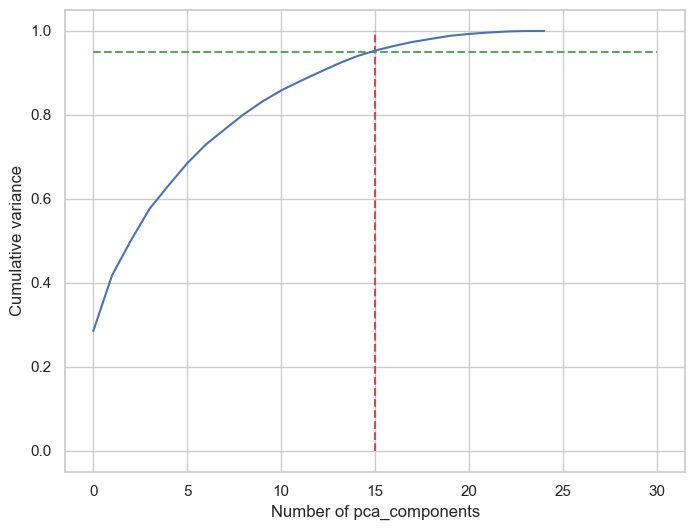

In [567]:
# Plotting Cumulative variance vs number of pca components
fig = plt.figure(figsize=[8,6])
plt.vlines(x=15, ymax=1, ymin=0, colors="r", linestyles="--")
plt.hlines(y=0.95, xmax=30, xmin=0, colors="g", linestyles="--")
plt.plot(cummulative_variance)
plt.ylabel("Cumulative variance")
plt.xlabel("Number of pca_components")
plt.show()

# from the below curve, optimum number of features are 15 to explain 95% variance

#### Observation:
        - The plots displays that 15 features are explaining 95% variance

In [568]:
pca_optimum = IncrementalPCA(n_components=15)
X_train_scaled.shape

(55999, 25)

In [569]:
# PCA fitment
train_pca_df = pca_optimum.fit_transform(X_train_scaled)
test_pca_df = pca_optimum.transform(X_test_scaled)

In [570]:
corr_matrix = np.corrcoef(train_pca_df.transpose())

<Axes: >

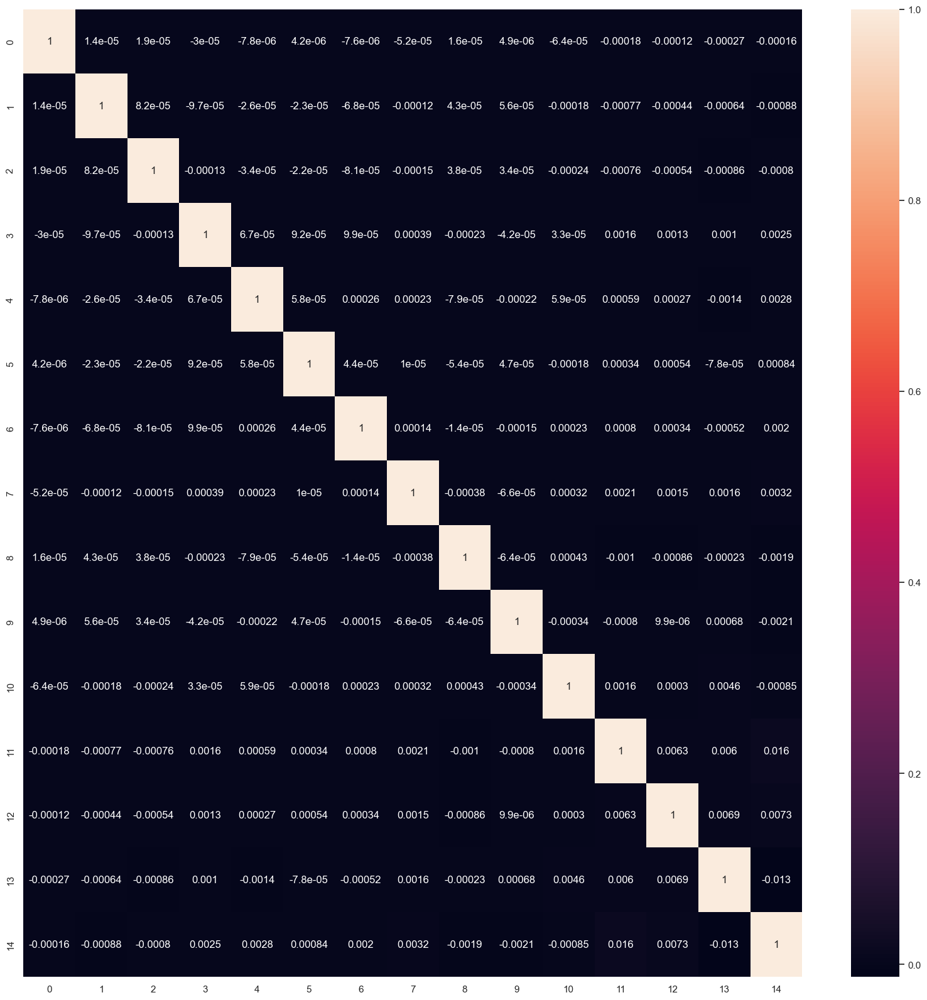

In [571]:
# heatmap
plt.figure(figsize=[20,20])
sns.heatmap(corr_matrix, annot=True)


#### Observation:
        -  No collinearity present

In [572]:
X_test_scaled = scaler.transform(X_test)
test_pca_final_df = pca_optimum.transform(X_test_scaled)
test_pca_final_df

array([[-1.28877989,  1.26258233, -1.51194843, ..., -1.54962633,
         1.34419576,  0.11114434],
       [ 0.34537753,  0.60156745, -0.7117473 , ...,  0.23473532,
        -1.36000108,  0.1726406 ],
       [-2.72824941, -0.33617658, -0.02624548, ...,  0.09131259,
        -0.05236707, -0.12776656],
       ...,
       [-1.5403538 ,  1.07706961, -0.00652455, ...,  0.50736759,
         0.04051583, -0.03073262],
       [-0.11781783, -0.81840324, -1.5204522 , ..., -0.66221773,
         0.08465358, -0.29771327],
       [ 1.49399333,  1.03556166, -1.56114441, ...,  0.1936863 ,
        -0.0306648 , -0.261747  ]])

### 3. GBM Model


In [573]:
gb_obj = GradientBoostingClassifier(random_state=42)
gb_obj.get_params()

{'ccp_alpha': 0.0,
 'criterion': 'friedman_mse',
 'init': None,
 'learning_rate': 0.1,
 'loss': 'log_loss',
 'max_depth': 3,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_iter_no_change': None,
 'random_state': 42,
 'subsample': 1.0,
 'tol': 0.0001,
 'validation_fraction': 0.1,
 'verbose': 0,
 'warm_start': False}

In [574]:
# fitting GBM on train_pca_df
gb_obj.fit(train_pca_df, y_train)
gb_pred_train = gb_obj.predict(train_pca_df)
gb_pred_test = gb_obj.predict(test_pca_df)

In [575]:
print("Train Accuracy :", accuracy_score(y_train, gb_pred_train))
print("Train Sensitivity :", recall_score(y_train, gb_pred_train))
print("Test Accuracy :", accuracy_score(y_test, gb_pred_test))
print("Test Sensitivity :", recall_score(y_test, gb_pred_test))

Train Accuracy : 0.9300344649011589
Train Sensitivity : 0.5144599303135888
Test Accuracy : 0.9304285714285714
Test Sensitivity : 0.5


In [576]:
evaluation_model_df.loc['GBM', 'Accuracy'] = round(accuracy_score(y_test, gb_pred_test), 3)
evaluation_model_df.loc['GBM', 'Sensitivity'] = round(recall_score(y_test, gb_pred_test), 3)
evaluation_model_df

,Accuracy,Sensitivity
Logistic Reg,0.76,0.85
GBM,0.93,0.50
Logistic Reg with PCA,0.00,0.00
XGBoost,0.00,0.00
Random Forest,0.00,0.00


### 4 Logistic Regression with PCA

In [577]:
# fitting with LR
X_train_sm = sm.add_constant(train_pca_df)
y_train = pd.DataFrame(y_train)
logm4 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm4.fit()
X_test_sm = sm.add_constant(test_pca_df)

In [578]:
# predictions
y_test_pred = res.predict(X_test_sm)

In [579]:
y_test_pred_final = pd.DataFrame({'True_Churn':y_test.values, 'Churn_Prob':y_test_pred})
y_test_pred_final['Pred_Churn'] = y_test_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.1 else 0)

In [580]:
print("Test Accuracy :",metrics.accuracy_score(y_test_pred_final.True_Churn, y_test_pred_final.Pred_Churn))
print("Test Sensitivity :",metrics.recall_score(y_test_pred_final.True_Churn, y_test_pred_final.Pred_Churn))

Test Accuracy : 0.7622142857142857
Test Sensitivity : 0.8477011494252874


In [581]:
evaluation_model_df.loc['Logistic Reg with PCA', 'Accuracy'] = round(accuracy_score(y_test_pred_final.True_Churn, y_test_pred_final.Pred_Churn), 3)
evaluation_model_df.loc['Logistic Reg with PCA', 'Sensitivity'] = round(recall_score(y_test_pred_final.True_Churn, y_test_pred_final.Pred_Churn), 3)
evaluation_model_df

,Accuracy,Sensitivity
Logistic Reg,0.76,0.85
GBM,0.93,0.50
Logistic Reg with PCA,0.76,0.85
XGBoost,0.00,0.00
Random Forest,0.00,0.00


### 5. XGBoost

In [583]:
xgb_obj = xgb.XGBClassifier(n_jobs = -1,objective = 'binary:logistic')
xgb_obj.get_params()

{'objective': 'binary:logistic',
 'base_score': None,
 'booster': None,
 'callbacks': None,
 'colsample_bylevel': None,
 'colsample_bynode': None,
 'colsample_bytree': None,
 'device': None,
 'early_stopping_rounds': None,
 'enable_categorical': False,
 'eval_metric': None,
 'feature_types': None,
 'gamma': None,
 'grow_policy': None,
 'importance_type': None,
 'interaction_constraints': None,
 'learning_rate': None,
 'max_bin': None,
 'max_cat_threshold': None,
 'max_cat_to_onehot': None,
 'max_delta_step': None,
 'max_depth': None,
 'max_leaves': None,
 'min_child_weight': None,
 'missing': nan,
 'monotone_constraints': None,
 'multi_strategy': None,
 'n_estimators': None,
 'n_jobs': -1,
 'num_parallel_tree': None,
 'random_state': None,
 'reg_alpha': None,
 'reg_lambda': None,
 'sampling_method': None,
 'scale_pos_weight': None,
 'subsample': None,
 'tree_method': None,
 'validate_parameters': None,
 'verbosity': None}

In [585]:
# model fitment
xgb_obj.fit(train_pca_df, y_train)
# predictions
xgb_prediction = xgb_obj.predict(test_pca_df)

In [586]:
print("Test Accuracy :",metrics.accuracy_score(y_test, xgb_prediction))
print("Test Sensitivity :",metrics.recall_score(y_test, xgb_prediction))

Test Accuracy : 0.9293571428571429
Test Sensitivity : 0.5359195402298851


In [587]:
evaluation_model_df.loc['XGBoost', 'Accuracy'] = round(accuracy_score(y_test, xgb_prediction), 3)
evaluation_model_df.loc['XGBoost', 'Sensitivity'] = round(recall_score(y_test, xgb_prediction), 3)
evaluation_model_df

,Accuracy,Sensitivity
Logistic Reg,0.76,0.85
GBM,0.93,0.50
Logistic Reg with PCA,0.76,0.85
XGBoost,0.93,0.54
Random Forest,0.00,0.00


### 6. Random Forest

In [589]:
# random forest with hyperparameter tuning
rf_obj = RandomForestClassifier(random_state=42, n_jobs=-1)

In [592]:
# GridSearchCV
params = {
    'max_depth': [40,50,60],
    'min_samples_leaf': [3],
    'min_samples_split':[5],    
    'n_estimators': [95,100,110]
}
grid_search = GridSearchCV(estimator=rf_obj,
                           param_grid=params,
                           cv = 4,
                           n_jobs=-1, verbose=1, scoring="accuracy")

grid_search.fit(feature_telecom_rfc,y)

Fitting 4 folds for each of 9 candidates, totalling 36 fits


GridSearchCV(cv=4, estimator=RandomForestClassifier(n_jobs=-1, random_state=42),
             n_jobs=-1,
             param_grid={'max_depth': [40, 50, 60], 'min_samples_leaf': [3],
                         'min_samples_split': [5],
                         'n_estimators': [95, 100, 110]},
             scoring='accuracy', verbose=1)

In [593]:
grid_search.best_score_

0.9419706138309945

In [594]:
# Best Hyperparameters
rf_best = grid_search.best_estimator_
rf_best

RandomForestClassifier(max_depth=40, min_samples_leaf=3, min_samples_split=5,
                       n_estimators=110, n_jobs=-1, random_state=42)

In [595]:
rf = RandomForestClassifier(max_depth=40, min_samples_leaf=3, min_samples_split=5,
                       n_estimators=110, n_jobs=-1, random_state=42,oob_score = True)
rf.fit(feature_telecom_rfc,y)

RandomForestClassifier(max_depth=40, min_samples_leaf=3, min_samples_split=5,
                       n_estimators=110, n_jobs=-1, oob_score=True,
                       random_state=42)

In [596]:
print("OOB score: ", rf.oob_score_)

OOB score:  0.9417848826411805


In [600]:
rf_pred = rf.predict(feature_telecom_rfc)

In [601]:
print("Test Accuracy :",metrics.accuracy_score(y, rf_pred))
print("Test Sensitivity :",metrics.recall_score(y, rf_pred))

Test Accuracy : 0.9728424691781311
Test Sensitivity : 0.7805664610207516


In [602]:
evaluation_model_df.loc['Random Forest', 'Accuracy'] = round(accuracy_score(y, rf_pred), 3)
evaluation_model_df.loc['Random Forest', 'Sensitivity'] = round(recall_score(y, rf_pred), 3)
evaluation_model_df

,Accuracy,Sensitivity
Logistic Reg,0.76,0.85
GBM,0.93,0.50
Logistic Reg with PCA,0.76,0.85
XGBoost,0.93,0.54
Random Forest,0.97,0.78


### Model Selection

Following models can be considered based on their performances:
- Logistic Regression with highest sensitivity
- Random Forest with highest accuracy
- For Kaggle hackathon, the model will be Random Forest with high accuracy, compromising little on the sensitivity aspect.
- Logistic Regression with feature selection using Random Forest and RFE will be considered a balanced model due to its high sensitivity.

### Kaggle Submission

In [623]:
kaggle_df= pd.read_csv("test.csv")

In [624]:
kaggle_df = kaggle_df.fillna(0)
kaggle_df = pd.DataFrame(kaggle_df)
kaggle_id = kaggle_df['id']

In [625]:
kaggle_df = kaggle_df[feature_telecom_rfc.columns]

In [627]:
kaggle_df.shape

(30000, 112)

In [629]:
# Kaggle predictions
pred_kaggle_final = rf.predict(kaggle_df)

In [630]:
result = pd.DataFrame({"id":kaggle_id,"churn_probability":pred_kaggle_final})
result.to_csv('Submission.csv', header=True,index=False)

## Conclusion

- Logistic Regression with feature selection using Random Forest and RFE emerges as the best model from a business perspective.
- The primary goal is to reduce customer churn, making the identification of potential churning customeis rs crucial.
- Therefore, the most important metric is **SENSITIVITY**.
- The model demonstrates the following performance:
    - **Accuracy**: 0.76 (76% of the predictions are correct)
    - **Sensitivity**: 0.85 (85% of the customers identified have actually churned)
ed**)

**Most important features are -**
- 'total_og_mou_8',
- 'total_og_mou_7',
- 'total_ic_mou_6',
- 'total_rech_num_8',
- 'loc_ic_t2m_mou_8',
- 'aon',
- 'last_day_rch_amt_8',
- 'mloc_ic_t2t_mou_8',
- 'av_rech_amt_data_8',
- 'std_ic_mou_8',
- 'roam_og_mou_8'e1_no_of_days'

### Business Recommendation

- Total outgoing call duration (total_og_mou) shows a constant decline from June to August for churning customers. So, the sales team may talk to customers who are showing this decreasing trend and may provide discounts and offers as per their need.
- There is a decrease in incoming and outgoing calls usage for churning customers. If the business finds a decrease in the mou, then they should try to retain those customers by coming up with better offers, most likely unlimited plans, etc. Also, this may be due to poor network service in some areas where the network needs to be improved.
- A declining trend is observed with recharge columns as well. A decrease in the average recharge amount or an increase in the number of days since the last recharge is an indicator of churn. Provide offers and discounts.
- Outgoing calls during roaming are an important predictor variable; it looks like customers are churning for better roaming plans. The business can come up with better roaming packs for its customers.
- Age on network 'aon' is also an important feature. Old customers are least likely to churn. However, relatively new customers are prone to churn. The sales team must provide offers to new high-revenue customers to stop the churn.
